# **Intro M1**
In this notebook I set up semi-supervised VAE to predict cell type proportions from bulk data.
This is the original model structure (M1)
This is almost identical to "[DIVA: DOMAIN INVARIANT VARIATIONAL AUTOENCODERS](https://arxiv.org/pdf/1905.10427.pdf)".
To breifly describe the model, we have 3 independent encoders that encode for different sources of variation: cell-type proportion, sample-id, and everything else (slack).
To enforce this disentanglement, there are classification losses on the cell-type and smaple_id embeddings.
The embeddings are then concatenated together and used as input to a joint decoder.
When used in the semi-supervised mode, the classification loss is calculated by comparing the classifier output to the latent digit representation.
The model is depicted below.



The experimental set-up is as follows:
All data is from pbmc6k dataset.
Cells are sampled to generate 10 pesudobulks.
There are perturbed samples --> this means that for some samples we have mono14 cells instead of mono16 cells. 
This is like a perturbation that would cause one cell type to change.
We use 2 samples as the labeled data (meaning each sample has a ground truth) and 8 samples with unlabeled data (ground truth proportions are not used in training.)




This code was based off of DIVA's codebase: https://github.com/AMLab-Amsterdam/DIVA

Semi-supervised training method was take from here:
And this tutorial: https://github.com/bjlkeng/sandbox/tree/master/notebooks/vae-semi_supervised_learning with an awesome accomanying blogpost: https://bjlkeng.github.io/posts/semi-supervised-learning-with-variational-autoencoders/

Another codebase referenced: https://github.com/saemundsson/semisupervised_vae



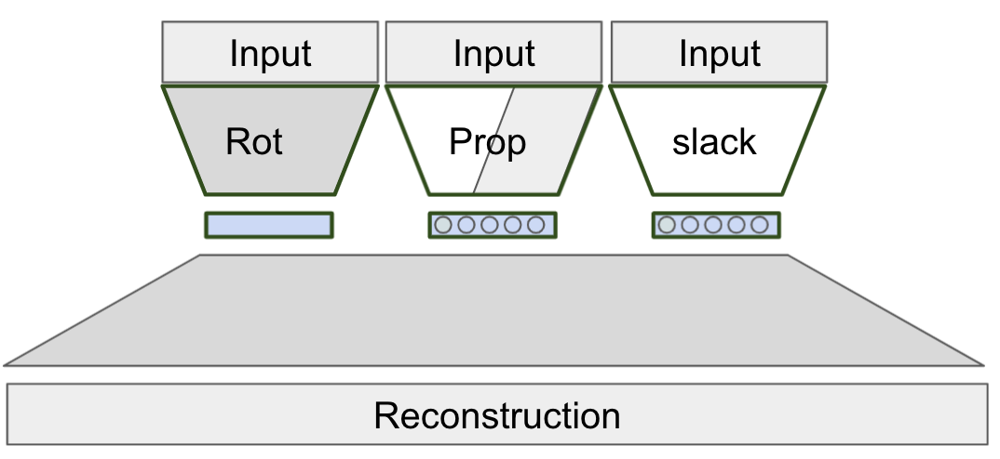

# **Imports**

In [167]:
# general imports
import warnings
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Lambda, Flatten, Softmax, ReLU, ELU, LeakyReLU
from keras.layers.merge import concatenate as concat
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import backend as K
from tensorflow.keras.losses import mean_absolute_error, mean_squared_error, KLDivergence
from tensorflow.keras.datasets import mnist
from tensorflow.keras.activations import relu, linear
from tensorflow.keras.utils import to_categorical, normalize, plot_model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
from scipy.stats import spearmanr, pearsonr, ttest_ind, wilcoxon
from scipy.spatial.distance import euclidean
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score
from PIL import Image

from tqdm import tnrange, tqdm_notebook
import ipywidgets

# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2
from upsetplot import from_contents, UpSet

# programming stuff
import time
import os
import pickle
from pathlib import Path

# import the SC_preprocessing code
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
from sc_preprocessing import sc_preprocess
from method_comparison import validation_plotting as vp


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [173]:
from importlib import reload  # Python 3.4+
reload(sc_preprocess)
reload(vp)

<module 'method_comparison.validation_plotting' from '/beevol/home/davidson/checkouts/sc_bulk_ood/exploratory_experiments/../method_comparison/validation_plotting.py'>

In [115]:
## parameters
aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_kang_data/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_kang/"
cibersort_genes_path = f"{os.getcwd()}/../results/single_cell_data/cibersort_kang/CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_phenoclasses.CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_refsample.bm.K999.txt"

# cibersort results
cibersort_file_path = f"{os.getcwd()}/../results/single_cell_data/cibersort_kang/CIBERSORTx_Job18_Results.csv"

# bp results
bp_res_path = f"{os.getcwd()}/../results/single_cell_data/bp_kang/"

# DiffExp results
de_res_path = f"{os.getcwd()}/../data/single_cell_data/kang_rybakov/kang_DE_paper.tsv"

num_genes = 7000

exp_id = "all-kang"

# Set-up experimental variables

In [4]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 10

# number of patients/domains/samples expected
idx_range = range(0, 16)
n_tot_samples = 8 # 8 patients, 2 samples each

# number of drugs (one-hot encoded)
n_drugs = 2

# experiment id
lab_file_name = exp_id


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [5]:

##################################################
#####. Design the experiment
##################################################

# read in the labeled data
X_full, Y_full, gene_df, meta_df = sc_preprocess.read_all_kang_pseudobulk_files(aug_data_path, exp_id)
X_full.columns = gene_df

X_orig = np.copy(X_full)

# set up the metadata arrays and indices
samp_label = np.asarray(meta_df.sample_id)
index_label, numeric_label = np.unique(samp_label, return_inverse=True)
Label_full = numeric_label
label_full = to_categorical(numeric_label)

samp_drug = np.asarray(meta_df.stim)
index_drug, numeric_drug = np.unique(samp_drug, return_inverse=True)
Drug_full = numeric_drug
drug_full = to_categorical(numeric_drug)

idx_train = np.where(meta_df.isTraining=="Train")[0] 
idx_test = np.where(meta_df.isTraining!="Train")[0] 
idx_bulk = np.where(meta_df.samp_type == "bulk")[0]
idx_sc = np.where(meta_df.samp_type != "bulk")[0]
idx_drug = np.where(meta_df.stim == "STIM")[0]

Y_max = np.copy(Y_full)
Y_max = np.argmax(Y_max, axis=1)
Y_max = Y_full.columns[Y_max]
meta_df["Y_max"] = Y_max

# now seperate out the training and testing data
X_train_df = X_full.iloc[idx_train]
Y_train_df = Y_full.iloc[idx_train]

# only get genes that are available in both testing and training
common_genes_file = os.path.join(aug_data_path, "kang_genes.pkl")
gene_out_path = Path(common_genes_file)
common_genes = pickle.load(open( gene_out_path, "rb" ))

# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(common_genes, cibersort_genes)

X_train_df = X_train_df[common_genes]

gene_df = gene_df.loc[gene_df.isin(common_genes)]


# convert to data matrices
X_train = X_train_df.to_numpy()
Y_train = Y_train_df.to_numpy()

## get the top variable genes
X_colmean = X_train.mean(axis=0)
X_colvar = X_train.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))
idx_top = np.argpartition(X_CoV, -num_genes)[-num_genes:]
gene_df = gene_df.iloc[idx_top]


In [6]:
X_train_df

gene_ids,LINC00115,NOC2L,KLHL17,PLEKHN1,HES4,ISG15,AGRN,C1orf159,TNFRSF18,TNFRSF4,...,CPT1B,AF127936.5,AJ006998.2,CHODL,AP000476.1,LINC00158,AF131217.1,AP001437.1,TMPRSS3,LRRC3DN
0,3,661,2,1,565,5250,0,23,1542,158,...,0,0,0,0,0,0,0,0,0,0
0,6,277,3,1,174,6684,0,13,423,101,...,0,0,0,0,0,0,0,0,0,0
0,57,446,0,0,53,11356,0,66,1046,163,...,0,0,0,0,0,0,0,0,0,0
0,16,674,2,48,278,8676,0,31,644,877,...,0,0,0,0,0,0,0,0,0,0
0,11,602,0,16,394,7718,0,46,882,334,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,14,923,0,6,77,7930,0,0,869,150,...,0,0,0,0,0,0,0,0,0,0
0,33,691,0,21,20,7755,0,0,376,96,...,0,0,0,0,0,0,0,0,0,0
0,30,1122,0,8,73,7979,0,0,352,131,...,0,0,0,0,0,0,0,0,0,0
0,25,1036,0,10,27,10822,0,0,704,141,...,0,0,0,0,0,0,0,0,0,0


In [7]:
X_train

array([[3, 661, 2, ..., 0, 0, 0],
       [6, 277, 3, ..., 0, 0, 0],
       [57, 446, 0, ..., 0, 0, 0],
       ...,
       [30, 1122, 0, ..., 0, 0, 0],
       [25, 1036, 0, ..., 0, 0, 0],
       [34, 1075, 0, ..., 0, 0, 0]], dtype=object)

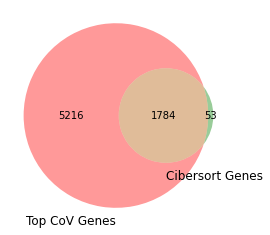

In [8]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [9]:
union_genes = np.union1d(gene_df, cibersort_genes)


In [10]:
def pearsonr_2D(x, y):
    """computes pearson correlation coefficient
       where x is a 1D and y a 2D array"""

    upper = np.sum((x - np.mean(x)) * (y - np.mean(y, axis=1)[:,None]), axis=1)
    lower = np.sqrt(np.sum(np.power(x - np.mean(x), 2)) * np.sum(np.power(y - np.mean(y, axis=1)[:,None], 2), axis=1))
    
    rho = upper / lower
    
    return rho

In [11]:
X_full = X_full.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)

# now normalize with the scaler trained on the 
# training data
X_full = np.clip(X_full, 0, clip_upper)
X_full = scaler.transform(X_full)


# for unknown proportions; 
# this is bulks used in training
idx_bulk_train = np.intersect1d(idx_bulk, idx_train) 
X_unkp = X_full[idx_bulk_train,]
label_unkp = label_full[idx_bulk_train,]
drug_unkp = drug_full[idx_bulk_train,]
y_unkp = Y_full.iloc[idx_bulk_train]
y_unkp = y_unkp.to_numpy()

# for known proportions
idx_sc_train = np.intersect1d(idx_sc, idx_train) 
X_kp = X_full[idx_sc_train,]
label_kp = label_full[idx_sc_train,]
drug_kp = drug_full[idx_sc_train,]
y_kp = Y_full.iloc[idx_sc_train]
y_kp = y_kp.to_numpy()



/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 15320 samples in 0.098s...
[t-SNE] Computed neighbors for 15320 samples in 31.960s...
[t-SNE] Computed conditional probabilities for sample 1000 / 15320
[t-SNE] Computed conditional probabilities for sample 2000 / 15320
[t-SNE] Computed conditional probabilities for sample 3000 / 15320
[t-SNE] Computed conditional probabilities for sample 4000 / 15320
[t-SNE] Computed conditional probabilities for sample 5000 / 15320
[t-SNE] Computed conditional probabilities for sample 6000 / 15320
[t-SNE] Computed conditional probabilities for sample 7000 / 15320
[t-SNE] Computed conditional probabilities for sample 8000 / 15320
[t-SNE] Computed conditional probabilities for sample 9000 / 15320
[t-SNE] Computed conditional probabilities for sample 10000 / 15320
[t-SNE] Computed conditional probabilities for sample 11000 / 15320
[t-SNE] Computed conditional probabilities for sample 12000 / 15320
[t-SNE] Computed conditional probabilities for sa

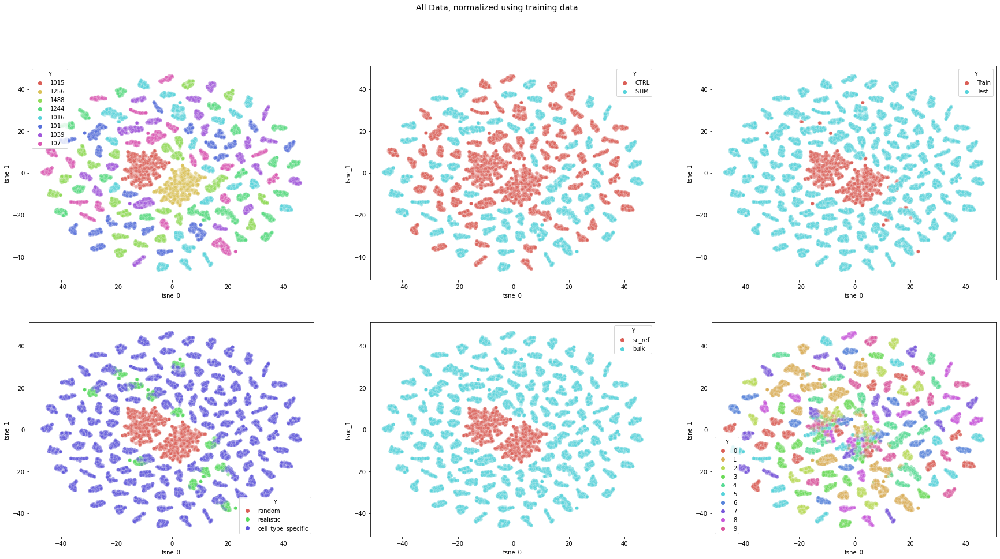

In [13]:
## plot samples
plot_df = vp.get_tsne_for_plotting(X_full)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_tsne(plot_df, meta_df.sample_id.to_numpy(), axs[0,0], title=f"")
vp.plot_tsne(plot_df, meta_df.stim.to_numpy(), axs[0,1], title=f"")
vp.plot_tsne(plot_df, meta_df.isTraining.to_numpy(), axs[0,2], title=f"")
vp.plot_tsne(plot_df, meta_df.cell_prop_type.to_numpy(), axs[1,0], title=f"")
vp.plot_tsne(plot_df, meta_df.samp_type.to_numpy(), axs[1,1], title=f"")
vp.plot_tsne(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

fig.show()


(13320, 2)
(13320, 2)


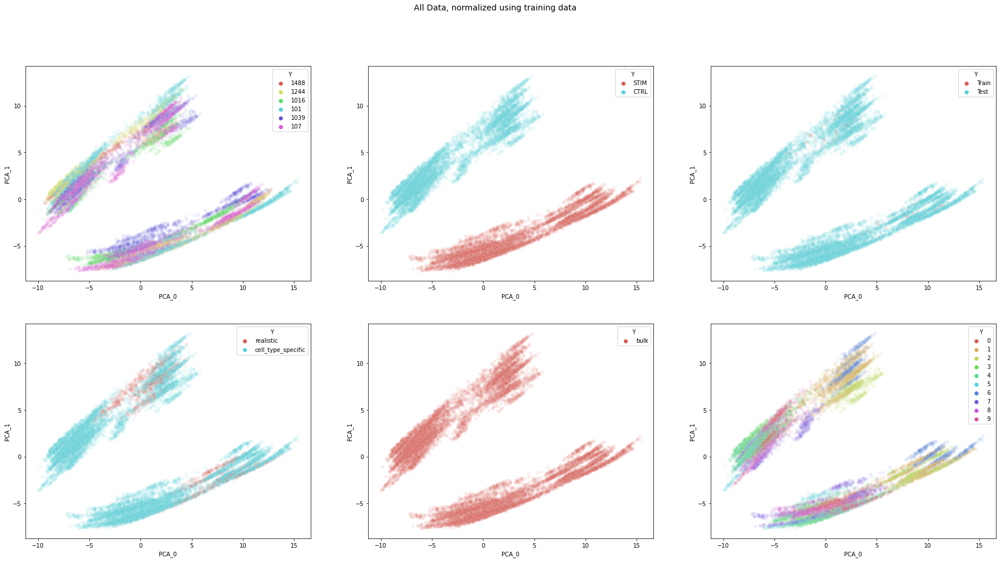

In [14]:
## plot samples
idx_interest = np.where(meta_df.samp_type == "bulk")[0]

plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

fig.show()


(2220, 2)
(2220, 2)


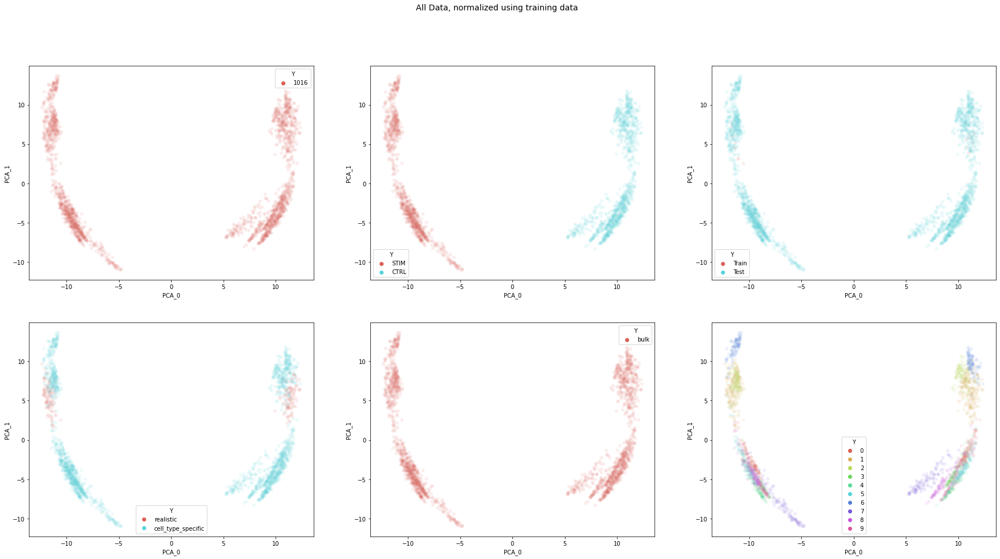

In [15]:
idx_interest = np.logical_and(meta_df.samp_type == "bulk", meta_df.sample_id == "1016")
idx_interest = np.where(idx_interest)[0]


plot_df = vp.get_pca_for_plotting(X_full[idx_interest])

fig, axs = plt.subplots(2, 3, figsize=(30,15))

Y_temp = np.copy(Y_full.iloc[idx_interest])
Y_temp = np.argmax(Y_temp, axis=1) 

vp.plot_pca(plot_df, meta_df.sample_id.to_numpy()[idx_interest], axs[0,0], title=f"")
vp.plot_pca(plot_df, meta_df.stim.to_numpy()[idx_interest], axs[0,1], title=f"")
vp.plot_pca(plot_df, meta_df.isTraining.to_numpy()[idx_interest], axs[0,2], title=f"")
vp.plot_pca(plot_df, meta_df.cell_prop_type.to_numpy()[idx_interest], axs[1,0], title=f"")
vp.plot_pca(plot_df, meta_df.samp_type.to_numpy()[idx_interest], axs[1,1], title=f"")
vp.plot_pca(plot_df, Y_temp, axs[1,2], title=f"")


fig.suptitle("All Data, normalized using training data", fontsize=14)

fig.show()



In [16]:
np.random.lognormal(0, 1, 10) 

array([1.88123332, 0.7861308 , 4.70064171, 1.68773664, 0.1851531 ,
       0.09073335, 3.44236824, 4.85747036, 0.65255973, 0.32171117])

# **M2 Model Definition**

## Hyperparameters

In [17]:

##################################################
#####. Hyperparameters
##################################################

batch_size = 500
n_epoch = 150 # 500 

alpha_rot = 1000000 #1000000
alpha_drug = 10000 #1000000
alpha_prop = 100 #100

beta_kl_slack = 0.1 # 10 ###
beta_kl_rot = 100 # 100 ###
beta_kl_drug = 100 # 100 ###


n_x = X_full.shape[1]
n_y = Y_full.shape[1]
n_label = n_tot_samples  # 8 donors 
n_drugs = n_drugs  # number of drugs one-hot encoded
n_label_z = 64  # 64 dimensional representation of rotation


# the network dimensions are 784 > 512 > proportion_dim < 512 < 784
n_z = Y_full.shape[1] # latent space size, one latent dimension PER cell type
encoder_dim = 512 # dim of encoder hidden layer 512 
decoder_dim = 512 # dim of encoder hidden layer 512 
decoder_out_dim = n_x # dim of decoder output layer

# labeled classifier
class_dim1 = 512 # 512 
class_dim2 = 256 # 256 


activ = 'relu'
optim = Adam(learning_rate=0.0005) #0.001
print(f"length of X {n_x} and length of y {n_y} n_label {n_label} and n_drugs {n_drugs}")



length of X 7053 and length of y 10 n_label 8 and n_drugs 2


## Encoder + Y classifier

In [18]:
# declare the Keras tensor we will use as input to the encoder
X = Input(shape=(n_x,))
Y = Input(shape=(n_y,))
label = Input(shape=(n_label,))
props = Input(shape=(n_y,))
z_in = Input(shape=(n_y+n_label_z+n_label_z+n_label_z,))
cls_in = Input(shape=(n_label_z,))

inputs = X

# set up encoder network
# this is an encoder with 512 hidden layer
# Dense is a functor, with given initializations (activation and hidden layer dimension)
# After initialization, the functor is returned and inputs is used as an arguement
encoder_s = Dense(encoder_dim, activation=activ, name="encoder_slack")(inputs)
encoder_r = Dense(encoder_dim, activation=activ, name="encoder_rot")(inputs)
encoder_d = Dense(encoder_dim, activation=activ, name="encoder_drug")(inputs)

# now from the hidden layer, you get the mu and sigma for 
# the latent space

mu_slack = Dense(n_label_z, activation='linear', name = "mu_slack")(encoder_s)
l_sigma_slack = Dense(n_label_z, activation='linear', name = "sigma_slack")(encoder_s)

mu_rot = Dense(n_label_z, activation='linear', name = "mu_rot")(encoder_r)
l_sigma_rot = Dense(n_label_z, activation='linear', name = "sigma_rot")(encoder_r)


mu_drug = Dense(n_label_z, activation='linear', name = "mu_drug")(encoder_d)
l_sigma_drug = Dense(n_label_z, activation='linear', name = "sigma_drug")(encoder_d)



# set up labeled classifier
#defining the architecture of the classifier

class_hidden1 = Dense(class_dim1, activation=activ, name = "cls_h1")
class_hidden2 = Dense(class_dim2, activation=activ, name="cls_h2")
class_out = Dense(n_y, activation='softmax', name="cls_out")

#x_concat_lab = tf.keras.layers.concatenate([inputs, label])
#classifier_h1 = class_hidden1(tf.keras.layers.Concatenate()([inputs, label]))
classifier_h1 = class_hidden1(inputs)
classifier_h2 = class_hidden2(classifier_h1)
Y_cls = class_out(classifier_h2)



## Latent Space

In [19]:
# now we need the sampler from mu and sigma
def sample_z(args):
    mu, l_sigma, n_z = args
    eps = K.random_normal(shape=(batch_size, n_z), mean=0., stddev=1.)
    return mu + K.exp(l_sigma / 2) * eps


# Sampling latent space
z_slack = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_slack")([mu_slack, l_sigma_slack, n_label_z])
z_rot = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_rot")([mu_rot, l_sigma_rot, n_label_z])
z_drug = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_drug")([mu_drug, l_sigma_drug, n_label_z])

z_concat_lab = concat([z_slack, Y, z_rot, z_drug])
z_concat_unlab = concat([z_slack, Y_cls, z_rot, z_drug])

2023-03-21 10:07:23.920142: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Decoder + Classifiers

In [20]:
def null_f(args):
    return args

###### DECODER
# set up decoder network
# this is a decoder with 512 hidden layer
decoder_hidden = Dense(decoder_dim, activation=activ, name = "decoder_h1")

# final reconstruction
decoder_out = Dense(decoder_out_dim, activation='sigmoid', name = "decoder_out")

d_in = Input(shape=(n_label_z+n_y+n_label_z+n_label_z,))
d_h1 = decoder_hidden(d_in)
d_out = decoder_out(d_h1)

# set up the decoder part that links to the encoder
# labeled decoder
h_lab = decoder_hidden(z_concat_lab)
outputs_lab = decoder_out(h_lab)

# unlabeled decoder
h_unlab = decoder_hidden(z_concat_unlab)
outputs_unlab = decoder_out(h_unlab)


###### Rotations classifier
# this is the rotation we try to estimate
rot_h1 = ReLU(name = "rot_h1")
rot_h2 = Dense(n_label, activation='linear', name = "rot_h2")
rot_softmax = Softmax(name = "mu_rot_pred")
decoder_sigma_r = Lambda(null_f, name = "l_sigma_rot_pred")


rot_1_out = rot_h1(z_rot)
rot_2_out = rot_h2(rot_1_out)
rotation_outputs = rot_softmax(rot_2_out)
sigma_outputs_r = decoder_sigma_r(l_sigma_rot)



###### Drug classifier
# this is the drug we try to estimate
drug_h1 = ReLU(name = "drug_h1")
drug_h2 = Dense(n_drugs, activation='linear', name = "drug_h2")
drug_softmax = Softmax(name = "mu_drug_pred")
decoder_sigma_d = Lambda(null_f, name = "l_sigma_drug_pred")


drug_1_out = drug_h1(z_drug)
drug_2_out = drug_h2(drug_1_out)
drug_outputs = drug_softmax(drug_2_out)
sigma_outputs_d = decoder_sigma_d(l_sigma_drug)








## Loss

In [21]:

def vae_loss(y_true, y_pred):
    recon = K.sum(mean_squared_error(y_true, y_pred), axis=-1)
    kl_rot = beta_kl_rot * K.sum(K.exp(l_sigma_rot) + K.square(mu_rot) - 1. - l_sigma_rot, axis=-1)
    kl_drug = beta_kl_drug * K.sum(K.exp(l_sigma_drug) + K.square(mu_drug) - 1. - l_sigma_drug, axis=-1)
    kl_slack = beta_kl_slack * K.sum(K.exp(l_sigma_slack) + K.square(mu_slack) - 1. - l_sigma_slack, axis=-1)
    return recon + kl_rot +kl_drug+ kl_slack


def recon_loss(y_true, y_pred):
	return K.sum(mean_squared_error(y_true, y_pred), axis=-1)


def prop_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_prop

def drug_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_drug


def class_loss(y_true, y_pred):
    recon = K.sum(K.binary_crossentropy(y_true, y_pred), axis=-1)*alpha_rot
    return recon



## Make the computational graph

In [22]:
classifier = Model(X, Y_cls)

known_prop_vae = Model([X, Y], [outputs_lab, Y_cls, rotation_outputs, drug_outputs])
unknown_prop_vae = Model(X, [outputs_unlab, rotation_outputs, drug_outputs])

known_prop_vae.compile(optimizer=optim, loss=[vae_loss, prop_loss, class_loss, drug_loss]) #, metrics = [KL_loss, recon_loss])
unknown_prop_vae.compile(optimizer=optim, loss=[vae_loss, class_loss, drug_loss]) #, metrics = [KL_loss, recon_loss])

encoder_unlab = Model(X, [z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug])

encoder_lab = Model([X, Y], [z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug])


decoder = Model(d_in, d_out)


print(known_prop_vae.summary())
print(unknown_prop_vae.summary())


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 7053)]       0                                            
__________________________________________________________________________________________________
encoder_slack (Dense)           (None, 512)          3611648     input_1[0][0]                    
__________________________________________________________________________________________________
encoder_rot (Dense)             (None, 512)          3611648     input_1[0][0]                    
__________________________________________________________________________________________________
encoder_drug (Dense)            (None, 512)          3611648     input_1[0][0]                    
____________________________________________________________________________________________

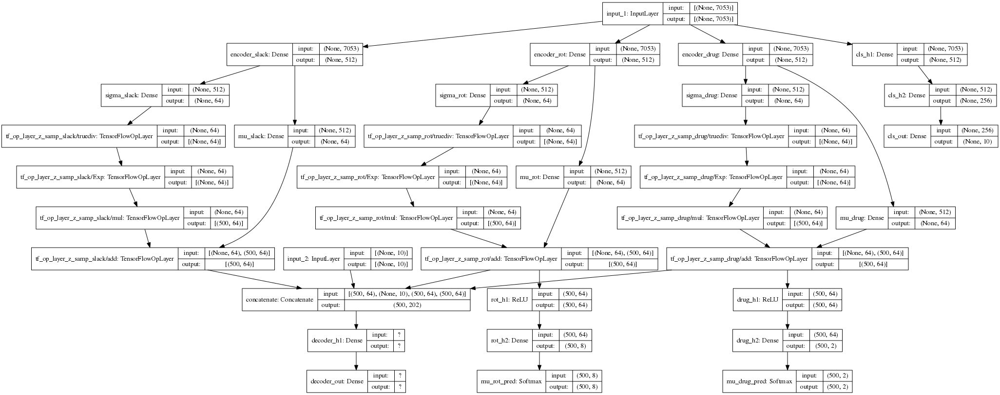

In [23]:
display(plot_model(known_prop_vae, show_layer_names=True, show_shapes=True, dpi=72))

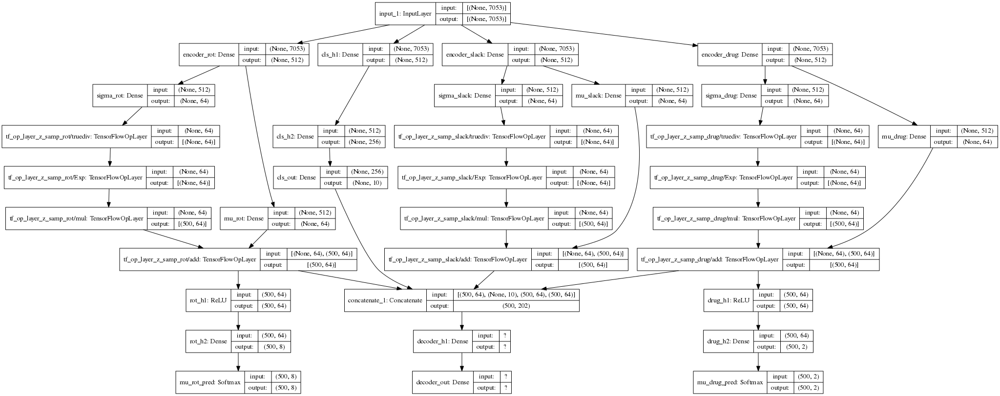

In [24]:
display(plot_model(unknown_prop_vae, show_layer_names=True, show_shapes=True, dpi=72))

# **Training**

Here we train using both the known and unknown cell-type proportions.
The labeled data is repeated in order to match the dimension of the unlabeled data so that they have the same batch size.
This code is taken from https://github.com/bjlkeng/sandbox/blob/master/notebooks/vae-semi_supervised_learning/vae-m2-fit-mnist.ipynb

In [25]:


def fit_model(X_unknown_prop, label_unknown_prop, drug_unknown_prop, X_known_prop, Y_known_prop, label_known_prop, drug_known_prop, epochs):
    assert len(X_unknown_prop) % len(X_known_prop) == 0, \
            (len(X_unknown_prop), batch_size, len(X_known_prop))
    start = time.time()
    history = []
    meta_hist = []
    
    for epoch in range(epochs):
        unlabeled_index = np.arange(len(X_unknown_prop))
        np.random.shuffle(unlabeled_index)

        # Repeat the unlabeled data to match length of labeled data
        labeled_index = []
        for i in range(len(X_unknown_prop) // len(X_known_prop)):
            l = np.arange(len(X_known_prop))
            np.random.shuffle(l)
            labeled_index.append(l)
        labeled_index = np.concatenate(labeled_index)
        
        batches = len(X_unknown_prop) // batch_size
        for i in range(batches):
            # Labeled
            index_range =  labeled_index[i * batch_size:(i+1) * batch_size]
            loss = known_prop_vae.train_on_batch([X_known_prop[index_range], Y_known_prop[index_range]],
                                                    [X_known_prop[index_range], Y_known_prop[index_range], label_known_prop[index_range], drug_known_prop[index_range]])
            meta_hist.append(i)

            # Unlabeled
            index_range =  unlabeled_index[i * batch_size:(i+1) * batch_size]
            loss += [unknown_prop_vae.train_on_batch(X_unknown_prop[index_range],
                                                        [X_unknown_prop[index_range], label_unknown_prop[index_range], drug_unknown_prop[index_range]])]

            meta_hist.append(i)

            history.append(loss)
            
    
   
    done = time.time()
    elapsed = done - start
    print("Elapsed: ", elapsed)
    
    return [history, meta_hist]

In [26]:
for layer in classifier.layers:
    print(layer)

In [27]:
for layer in encoder_unlab.layers:
    print(layer.name)

input_1
encoder_slack
encoder_rot
encoder_drug
sigma_slack
sigma_rot
sigma_drug
tf_op_layer_z_samp_slack/truediv
tf_op_layer_z_samp_rot/truediv
tf_op_layer_z_samp_drug/truediv
tf_op_layer_z_samp_slack/Exp
tf_op_layer_z_samp_rot/Exp
tf_op_layer_z_samp_drug/Exp
mu_slack
tf_op_layer_z_samp_slack/mul
mu_rot
tf_op_layer_z_samp_rot/mul
mu_drug
tf_op_layer_z_samp_drug/mul
tf_op_layer_z_samp_slack/add
tf_op_layer_z_samp_rot/add
tf_op_layer_z_samp_drug/add


Now train

In [28]:
# helper methods for evaluation
def sum_abs_error(y_pred, y_true):
  return sum(abs(y_pred - y_true))

def mean_abs_error(y_pred, y_true):
  return np.mean(abs(y_pred - y_true))

def mean_sqr_error(y_pred, y_true):
  return np.mean((y_pred - y_true)**2)

def get_errors(y_true, y_est):
  mse_err = [mean_sqr_error(y_true[idx], y_est[idx]) 
                  for idx in range(0, y_est.shape[0])]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"]*y_est.shape[0] + ["SPR"]*y_est.shape[0] + ["PEAR"]*y_est.shape[0]

  return plot_df


In [29]:
X_unkp.shape

(120, 7053)

In [30]:
x = np.array([[1,2],[3,4]])
x

array([[1, 2],
       [3, 4]])

In [31]:
# X_unknown_prop, label_unknown_prop, X_known_prop, Y_known_prop, label_known_prop
loss_history = fit_model(np.repeat(X_unkp, 100, axis=0),
                    np.repeat(label_unkp, 100, axis=0),
                    np.repeat(drug_unkp, 100, axis=0),
                    X_kp, 
                    y_kp,
                    label_kp, 
                    drug_kp, epochs=n_epoch)



Elapsed:  1988.1077613830566


In [32]:
meta_history = loss_history[1]
loss_history = loss_history[0]

# Plot Loss Curves

In [33]:
# write out the loss for later plotting
# unpack the loss values
labeled_total_loss = [item[0] for item in loss_history]
unlabeled_total_loss = [item[5][0] for item in loss_history]

labeled_recon_loss = [item[1] for item in loss_history]
unlabeled_recon_loss = [item[5][1] for item in loss_history]

labeled_prop_loss = [item[2] for item in loss_history]

labeled_samp_loss = [item[3] for item in loss_history]
unlabeled_samp_loss = [item[5][2] for item in loss_history]

labeled_drug_loss = [item[4] for item in loss_history]
unlabeled_drug_loss = [item[5][2] for item in loss_history]


# make into a dataframe
total_loss = labeled_total_loss + unlabeled_total_loss + [a + b for a, b in zip(labeled_total_loss, unlabeled_total_loss)]
loss_df = pd.DataFrame(data=total_loss, columns=['total_loss'])
loss_df['type'] = ["labeled"]*len(loss_history) + ["unlabeled"]*len(loss_history) + ["sum"]*len(loss_history)
loss_df['batch'] = [*range(len(loss_history))] + [*range(len(loss_history))] + [*range(len(loss_history))]

recon_loss = labeled_recon_loss + unlabeled_recon_loss + [a + b for a, b in zip(labeled_recon_loss, unlabeled_recon_loss)]
loss_df['recon_loss'] = recon_loss

prop_loss = labeled_prop_loss + [0]*len(loss_history) + labeled_prop_loss
loss_df['prop_loss'] = prop_loss

samp_loss = labeled_samp_loss + unlabeled_samp_loss + [a + b for a, b in zip(labeled_samp_loss, unlabeled_samp_loss)]
loss_df['samp_loss'] = samp_loss


drug_loss = labeled_drug_loss + unlabeled_drug_loss + [a + b for a, b in zip(labeled_drug_loss, unlabeled_drug_loss)]
loss_df['drug_loss'] = drug_loss



In [34]:
loss_df

,total_loss,type,batch,recon_loss,prop_loss,samp_loss,drug_loss
0,6.834456e+06,labeled,0,5609.457520,5751.563965,4.506835e+06,2.316260e+06
1,1.514030e+06,labeled,1,77522.562500,6164.188965,1.430341e+06,2.420602e+00
2,8.099134e+05,labeled,2,152131.640625,6026.530762,6.517552e+05,2.173247e-03
3,4.823012e+05,labeled,3,198479.265625,6708.333008,2.771136e+05,4.462677e-05
4,3.213098e+05,labeled,4,225622.296875,6692.545410,8.899490e+04,2.605707e-06
...,...,...,...,...,...,...,...
10795,2.124831e+04,sum,3595,18970.236328,221.776917,1.418253e+03,1.074899e+03
10796,2.127879e+04,sum,3596,18871.642578,325.520782,1.342262e+03,1.051476e+03
10797,2.145345e+04,sum,3597,18676.158203,281.800781,1.511287e+03,1.487642e+03
10798,2.139213e+04,sum,3598,18875.339844,345.848907,1.265895e+03,1.058994e+03


In [35]:
def read_loss_file(res_path, exp_id, unlab_id):
    loss_file = os.path.join(res_path, f"train-{exp_id}-{unlab_id}-DIVA_loss.pkl")
    loss_path = Path(loss_file)
    loss_df = pickle.load( open( loss_path, "rb" ) )
    return loss_df

def make_loss_fig(loss_df, ax, title, loss_to_plot):
    ## plot loss
    g = sns.lineplot(
        x="batch", y=loss_to_plot,
        data=loss_df,
        hue="type",
        legend="full",
        alpha=0.3, ax= ax
    )
    ax.set_title(title)
    return g

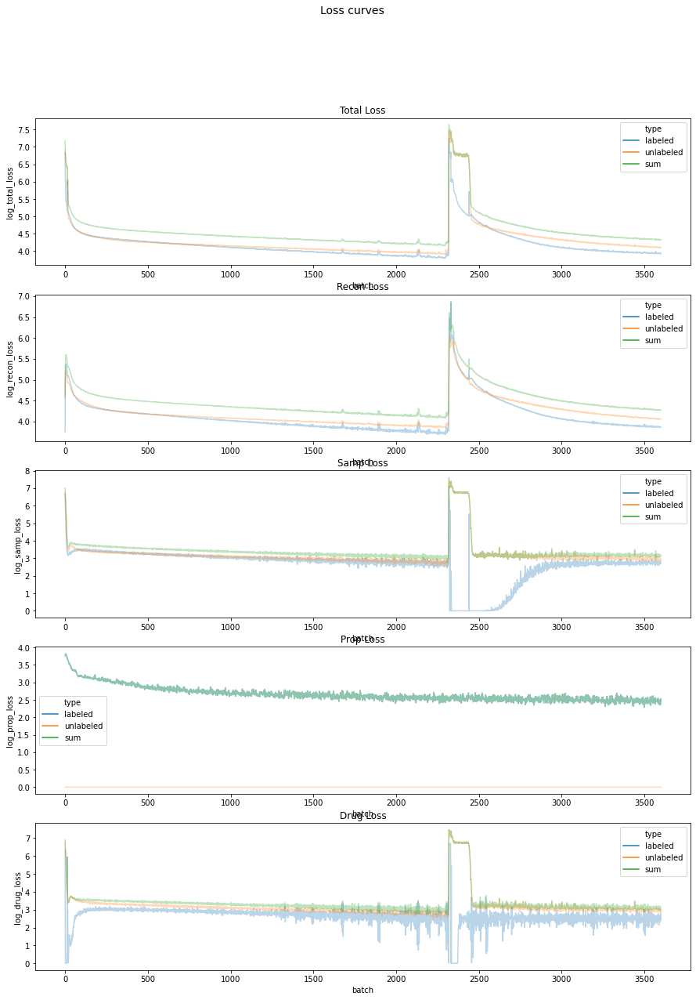

In [36]:

# add the log to make it easier to plot
loss_df["log_total_loss"] = np.log10(loss_df["total_loss"]+1)
loss_df["log_recon_loss"] = np.log10(loss_df["recon_loss"]+1)
loss_df["log_samp_loss"] = np.log10(loss_df["samp_loss"]+1)
loss_df["log_prop_loss"] = np.log10(loss_df["prop_loss"]+1)
loss_df["log_drug_loss"] = np.log10(loss_df["drug_loss"]+1)


fig, axs = plt.subplots(5, figsize=(15,20))

make_loss_fig(loss_df, ax=axs[0], title=f"Total Loss", loss_to_plot="log_total_loss")
make_loss_fig(loss_df, ax=axs[1], title=f"Recon Loss", loss_to_plot="log_recon_loss")
make_loss_fig(loss_df, ax=axs[2], title=f"Samp Loss", loss_to_plot="log_samp_loss")
make_loss_fig(loss_df, ax=axs[3], title=f"Prop Loss", loss_to_plot="log_prop_loss")
make_loss_fig(loss_df, ax=axs[4], title=f"Drug Loss", loss_to_plot="log_drug_loss")


fig.suptitle("Loss curves", fontsize=14)

fig.show()

In [37]:
def plot_cell_specific_corr(xval, yval, ax, title, xlab, ylab, class_id):

    plot_df = pd.DataFrame(list(zip(xval, yval)))
    plot_df.columns = [xlab, ylab]

    g = sns.scatterplot(
        x=xlab, y=ylab,
        data=plot_df,ax=ax,
        hue=class_id
    )
    g.set(ylim=(0, 1))
    g.set(xlim=(0, 1))
    g.plot([0, 1], [0, 1], transform=g.transAxes)

    ax.set_title(title)
    return g


def read_bp_result_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df

def read_bp_init_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


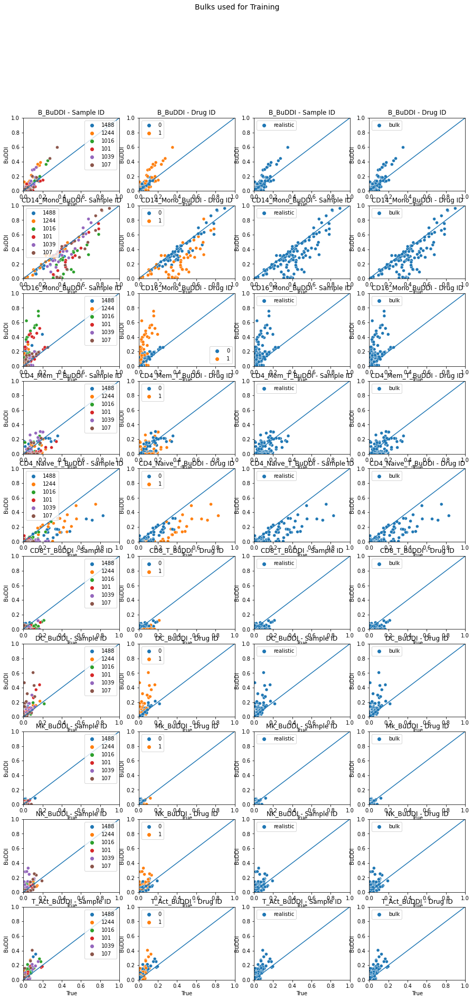

In [38]:
idx_tmp = np.intersect1d(idx_bulk, idx_train)
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_full.columns)
true_prop_df = Y_full.iloc[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]



fig, axs = plt.subplots(10, 4, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=label_temp[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
        
    row_idx = row_idx +1


fig.suptitle("Bulks used for Training", fontsize=14)

fig.show()

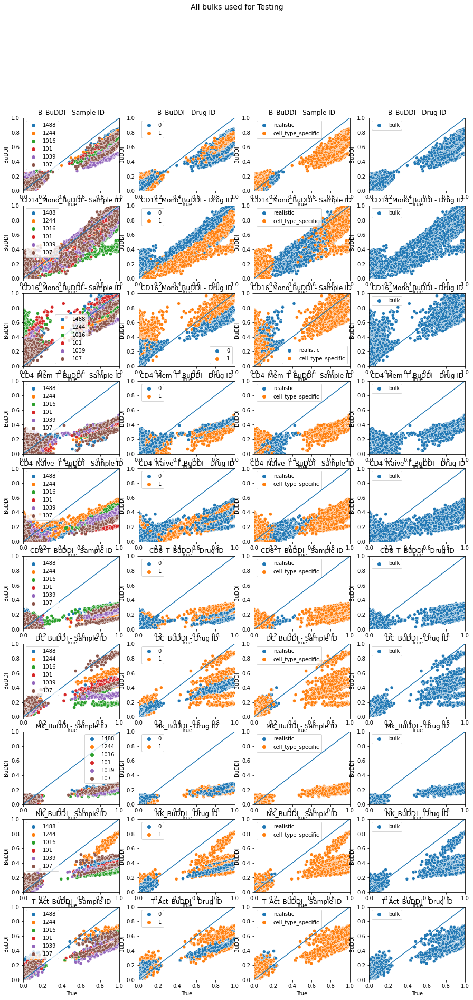

In [39]:
idx_tmp = idx_test
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_full.columns)
true_prop_df = Y_full.iloc[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = index_label[label_temp]



fig, axs = plt.subplots(10, 4, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=label_temp[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=meta_df.cell_prop_type.to_numpy()[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,3], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=meta_df.samp_type.to_numpy()[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("All bulks used for Testing", fontsize=14)

fig.show()

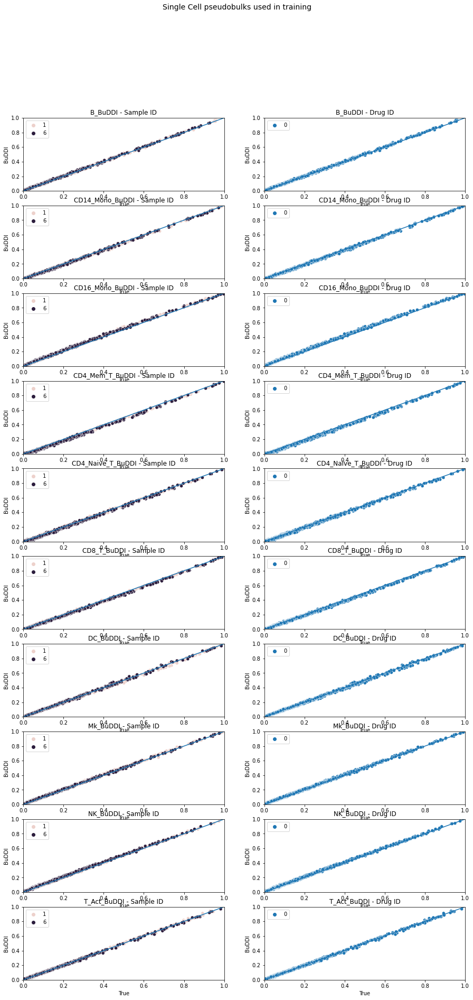

In [40]:
idx_tmp = idx_sc
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_full.columns)
true_prop_df = Y_full.iloc[idx_tmp]

fig, axs = plt.subplots(10, 2, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Label_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("Single Cell pseudobulks used in training", fontsize=14)

fig.show()

### compare errors

In [41]:
def read_diva_result_file(res_path, train_id, test_id, unlab_id):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-DIVA.pkl")
    res_path = Path(res_file)
    res_df = pickle.load( open( res_path, "rb" ) )
    return res_df

def read_bp_result_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df

def read_bp_init_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df




In [42]:
# helper methods for evaluation
def sum_abs_error(y_pred, y_true):
  return sum(abs(y_pred - y_true))

def mean_abs_error(y_pred, y_true):
  return np.mean(abs(y_pred - y_true))

def mean_sqr_error(y_pred, y_true):
  return np.mean((y_pred - y_true)**2)

def get_errors(y_true, y_est):
  mse_err = [mean_sqr_error(y_true[idx], y_est[idx]) 
                  for idx in range(0, y_est.shape[0])]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"]*y_est.shape[0] + ["SPR"]*y_est.shape[0] + ["PEAR"]*y_est.shape[0]

  return plot_df


def get_errors_single(y_true, y_est):
  mse_err = [mean_sqr_error(y_true, y_est)]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true, y_est)[0]]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true, y_est)[0]]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"] + ["SPR"] + ["PEAR"]

  return plot_df




In [43]:
meta_df

,sample_id,stim,isTraining,cell_prop_type,samp_type,Y_max
0,1015,CTRL,Train,random,sc_ref,B
1,1015,CTRL,Train,random,sc_ref,CD4_Naive_T
2,1015,CTRL,Train,random,sc_ref,Mk
3,1015,CTRL,Train,random,sc_ref,DC
4,1015,CTRL,Train,random,sc_ref,T_Act
...,...,...,...,...,...,...
1095,107,CTRL,Test,cell_type_specific,bulk,NK
1096,107,CTRL,Test,cell_type_specific,bulk,NK
1097,107,CTRL,Test,cell_type_specific,bulk,NK
1098,107,CTRL,Test,cell_type_specific,bulk,NK


MSqE mean: 0.002680612660892692, median: 0.0021709966893951826, max: 0.007039209553741458
Spearman mean: 0.6676767676767676, median: 0.7151515151515151, max: 0.9878787878787878
Pearson mean: 0.9085334177230795, median: 0.9254540005967045, max: 0.9995707072452713
MSqE mean: 0.019411825283284778, median: 0.017007305131725325, max: 0.055216396050829744
Spearman mean: 0.4056565656565656, median: 0.4121212121212121, max: 0.7939393939393938
Pearson mean: 0.481937191390447, median: 0.4638666780051902, max: 0.9825127046820169


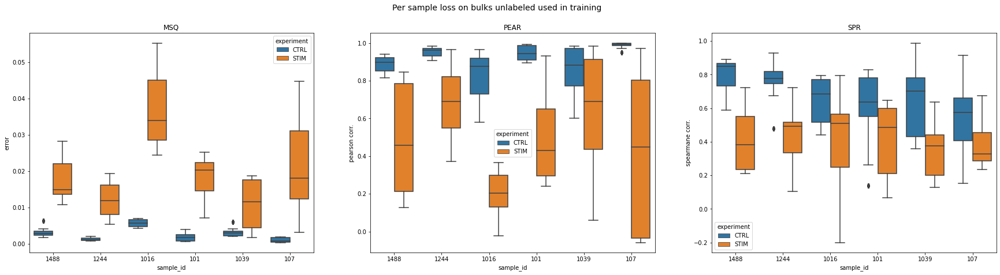

In [44]:
# Now compare across samples
idx_tmp = np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train")
idx_tmp = np.logical_and(idx_tmp, meta_df.stim == "CTRL")
idx_tmp = np.where( idx_tmp)[0]
idx_tmp = np.tile(idx_tmp, 100)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_ctrl = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_ctrl["experiment"] = ["CTRL"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["method"] = ["BuDDI"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["sample_id"] = np.tile(samp_ids, 3)


# Now compare across samples
idx_tmp = np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Train")
idx_tmp = np.logical_and(idx_tmp, meta_df.stim == "STIM")
idx_tmp = np.where( idx_tmp)[0]
idx_tmp = np.tile(idx_tmp, 100)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_stim = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_stim["experiment"] = ["STIM"]*buddi_err_stim.shape[0]
buddi_err_stim["method"] = ["BuDDI"]*buddi_err_stim.shape[0]
buddi_err_stim["sample_id"] = np.tile(samp_ids, 3)

plot_df = pd.concat([buddi_err_ctrl, buddi_err_stim])



# plot
fig, axs = plt.subplots(1, 3, figsize=(30,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Per sample loss on bulks unlabeled used in training", fontsize=14)

fig.show()

MSqE mean: 0.0026487310778888725, median: 0.00168977663990982, max: 0.014979398912199588
Spearman mean: 0.6838989898989897, median: 0.7212121212121211, max: 0.9878787878787878
Pearson mean: 0.9308547196818144, median: 0.9515403034057037, max: 0.999379366351255
MSqE mean: 0.01821579572161365, median: 0.016629443917990136, max: 0.05485252068575748
Spearman mean: 0.3668484848484848, median: 0.38181818181818183, max: 0.9393939393939393
Pearson mean: 0.5071340072422535, median: 0.5009093595690748, max: 0.994177252281708


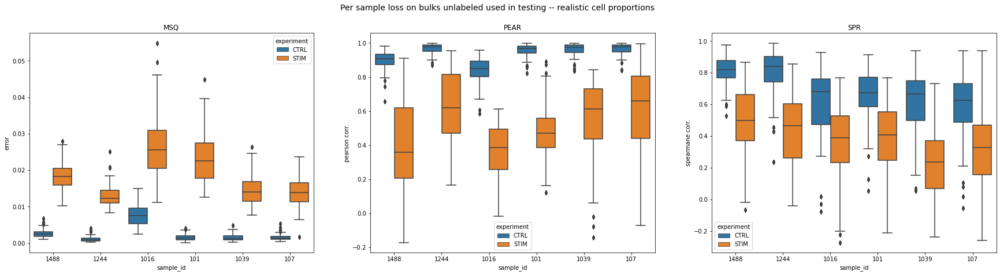

In [45]:
# Now compare across samples
idx_tmp = np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Test")
idx_tmp = np.logical_and(idx_tmp, meta_df.stim == "CTRL")
idx_tmp = np.logical_and(idx_tmp, meta_df.cell_prop_type == "realistic")
idx_tmp = np.where( idx_tmp)[0]
idx_tmp = np.tile(idx_tmp, 5)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_ctrl = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_ctrl["experiment"] = ["CTRL"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["method"] = ["BuDDI"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["sample_id"] = np.tile(samp_ids, 3)


# Now compare across samples
idx_tmp = np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Test")
idx_tmp = np.logical_and(idx_tmp, meta_df.stim == "STIM")
idx_tmp = np.logical_and(idx_tmp, meta_df.cell_prop_type == "realistic")
idx_tmp = np.where( idx_tmp)[0]
idx_tmp = np.tile(idx_tmp, 5)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_stim = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_stim["experiment"] = ["STIM"]*buddi_err_stim.shape[0]
buddi_err_stim["method"] = ["BuDDI"]*buddi_err_stim.shape[0]
buddi_err_stim["sample_id"] = np.tile(samp_ids, 3)

plot_df = pd.concat([buddi_err_ctrl, buddi_err_stim])



# plot
fig, axs = plt.subplots(1, 3, figsize=(30,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Per sample loss on bulks unlabeled used in testing -- realistic cell proportions", fontsize=14)

fig.show()

MSqE mean: 0.02805217102764503, median: 0.02569266233084667, max: 0.08810302498658204
Spearman mean: 0.39158181818181814, median: 0.406060606060606, max: 0.9878787878787878
Pearson mean: 0.7820301927469855, median: 0.8688985812467955, max: 0.9999976340769245
MSqE mean: 0.027718631278509633, median: 0.025968614916299478, max: 0.12364746357971237
Spearman mean: 0.33914141414141413, median: 0.35757575757575755, max: 0.9515151515151514
Pearson mean: 0.7642016138641148, median: 0.8487670063926018, max: 0.9999939953724775


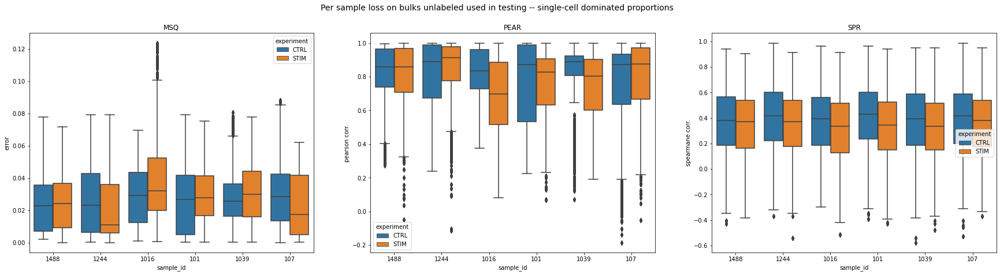

In [46]:
# Now compare across samples
idx_tmp = np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Test")
idx_tmp = np.logical_and(idx_tmp, meta_df.stim == "CTRL")
idx_tmp = np.logical_and(idx_tmp, meta_df.cell_prop_type == "cell_type_specific")
idx_tmp = np.where( idx_tmp)[0]
idx_tmp = np.tile(idx_tmp, 5)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_ctrl = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_ctrl["experiment"] = ["CTRL"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["method"] = ["BuDDI"]*buddi_err_ctrl.shape[0]
buddi_err_ctrl["sample_id"] = np.tile(samp_ids, 3)


# Now compare across samples
idx_tmp = np.logical_and(meta_df.samp_type == "bulk", meta_df.isTraining == "Test")
idx_tmp = np.logical_and(idx_tmp, meta_df.stim == "STIM")
idx_tmp = np.logical_and(idx_tmp, meta_df.cell_prop_type == "cell_type_specific")
idx_tmp = np.where( idx_tmp)[0]
idx_tmp = np.tile(idx_tmp, 5)


X_tmp = X_full[idx_tmp,]
Y_tmp = Y_full.iloc[idx_tmp]
samp_ids = meta_df.sample_id.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err_stim = get_errors(Y_tmp.to_numpy(), prop_outputs)


# format the errors
buddi_err_stim["experiment"] = ["STIM"]*buddi_err_stim.shape[0]
buddi_err_stim["method"] = ["BuDDI"]*buddi_err_stim.shape[0]
buddi_err_stim["sample_id"] = np.tile(samp_ids, 3)

plot_df = pd.concat([buddi_err_ctrl, buddi_err_stim])



# plot
fig, axs = plt.subplots(1, 3, figsize=(30,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="sample_id", y="error",
            hue="experiment", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Per sample loss on bulks unlabeled used in testing -- single-cell dominated proportions", fontsize=14)

fig.show()

# **Inspect the output**

## TSNE training data

Now that we know what is expected, let's see what we get from the model. We find that out of our encoder, after applying ReLU, we get pretty close to the expected proportions.

In [47]:
""" import umap

def vp.get_umap_for_plotting(encodings):
    fit = umap.UMAP()
    umap_results = fit.fit_transform(encodings)

    plot_df = pd.DataFrame(umap_results[:,0:2])
    print(umap_results.shape)
    print(plot_df.shape)
    plot_df.columns = ['umap_0', 'umap_1']
    return plot_df

def vp.plot_umap(plot_df, color_vec, ax, title="", alpha=0.3):

    plot_df['Y'] = color_vec

    g = sns.scatterplot(
        x="umap_0", y="umap_1",
        data=plot_df,
        hue="Y",
        palette=sns.color_palette("hls", len(np.unique(color_vec))),
        legend="full",
        alpha=alpha, ax= ax
    )

    ax.set_title(title)
    return g
 """

In [48]:
""" def vp.get_tsne_for_plotting(encodings):
    tsne = TSNE(n_components=2, verbose=1, perplexity=20, n_iter=500)
    tsne_results = tsne.fit_transform(encodings)

    plot_df = pd.DataFrame(tsne_results[:,0:2])
    print(tsne_results.shape)
    print(plot_df.shape)
    plot_df.columns = ['tsne_0', 'tsne_1']
    return plot_df

def vp.plot_tsne(plot_df, color_vec, ax, title=""):

    plot_df['Y'] = color_vec

    g = sns.scatterplot(
        x="tsne_0", y="tsne_1",
        data=plot_df,
        hue="Y",
        palette=sns.color_palette("hls", len(np.unique(color_vec))),
        legend="full",
        alpha=0.3, ax= ax
    )

    ax.set_title(title)
    return g
 """

In [49]:
"""from sklearn.decomposition import PCA

def vp.get_pca_for_plotting(encodings):
    fit = PCA(n_components=2)
    pca_results = fit.fit_transform(encodings)

    plot_df = pd.DataFrame(pca_results[:,0:2])
    print(pca_results.shape)
    print(plot_df.shape)
    plot_df.columns = ['PCA_0', 'PCA_1']
    return plot_df

def vp.plot_pca(plot_df, color_vec, ax, title="", alpha=0.1):

    plot_df['Y'] = color_vec

    g = sns.scatterplot(
        x="PCA_0", y="PCA_1",
        data=plot_df,
        hue="Y",
        palette=sns.color_palette("hls", len(np.unique(color_vec))),
        legend="full",
        alpha=alpha, ax= ax
    )

    ax.set_title(title)
    return g"""

## Plot Reconstruction

In [50]:
recon_idx = np.logical_and(meta_df.cell_prop_type == "realistic", meta_df.isTraining == "Test")
recon_idx = np.where(recon_idx)[0]




Y_temp = np.copy(Y_full.iloc[recon_idx])
Y_temp = np.argmax(Y_temp, axis=1)


label_temp = np.copy(Label_full[recon_idx])
perturb_temp = Drug_full[recon_idx]

# need duplicates
len_recon_idx = len(recon_idx)
recon_idx = np.tile(recon_idx, 5)
X_temp = np.copy(X_full[recon_idx])


prop_outputs = classifier.predict(X_temp, batch_size=batch_size)



# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)

decoded_outputs = decoded_outputs[0:len_recon_idx]
X_temp = X_temp[0:len_recon_idx]


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


(1200, 2)
(1200, 2)


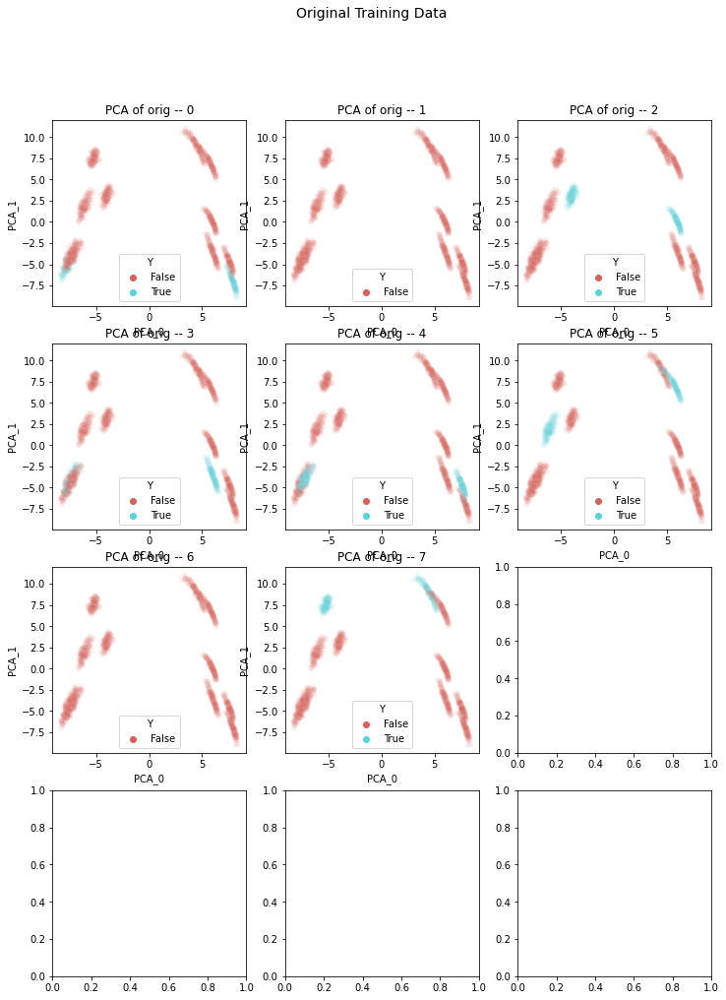

In [51]:

fig, axs = plt.subplots(4, 3, figsize=(12,16))

plot_df = vp.get_pca_for_plotting(np.asarray(X_temp))
vp.plot_pca(plot_df, color_vec=label_temp==0, ax=axs[0,0], title="PCA of orig -- 0")
vp.plot_pca(plot_df, color_vec=label_temp==1, ax=axs[0,1], title="PCA of orig -- 1")
vp.plot_pca(plot_df, color_vec=label_temp==2, ax=axs[0,2], title="PCA of orig -- 2")
vp.plot_pca(plot_df, color_vec=label_temp==3, ax=axs[1,0], title="PCA of orig -- 3")
vp.plot_pca(plot_df, color_vec=label_temp==4, ax=axs[1,1], title="PCA of orig -- 4")
vp.plot_pca(plot_df, color_vec=label_temp==5, ax=axs[1,2], title="PCA of orig -- 5")
vp.plot_pca(plot_df, color_vec=label_temp==6, ax=axs[2,0], title="PCA of orig -- 6")
vp.plot_pca(plot_df, color_vec=label_temp==7, ax=axs[2,1], title="PCA of orig -- 7")


fig.suptitle("Original Training Data", fontsize=14)

fig.show()

(1200, 2)
(1200, 2)


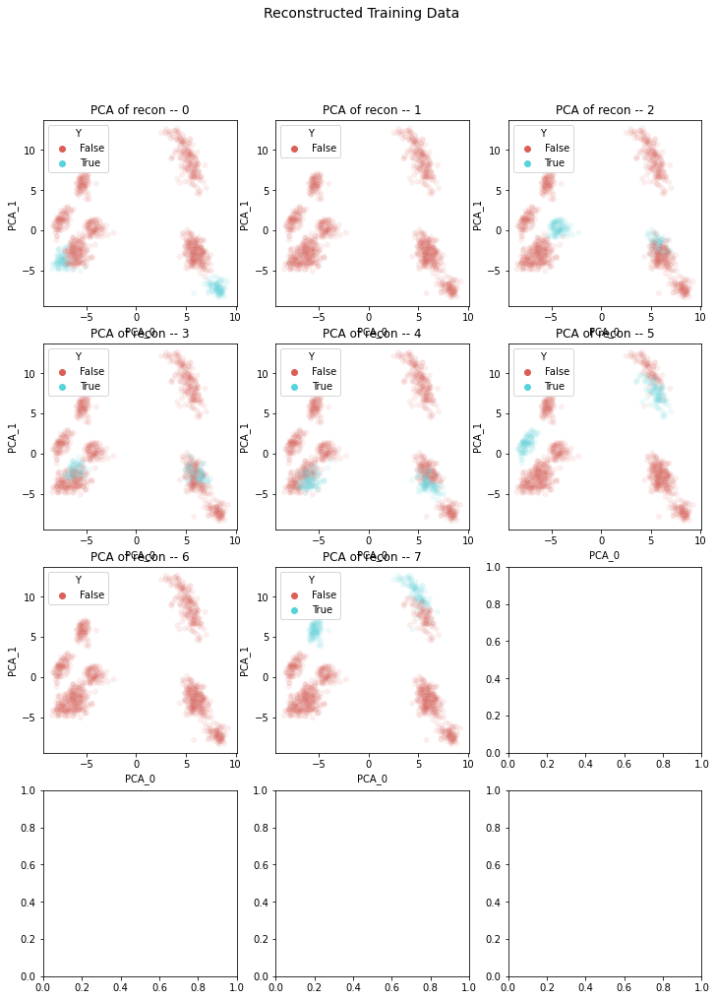

In [52]:

fig, axs = plt.subplots(4, 3, figsize=(12,16))

plot_df = vp.get_pca_for_plotting(np.asarray(decoded_outputs))
vp.plot_pca(plot_df, color_vec=label_temp==0, ax=axs[0,0], title="PCA of recon -- 0")
vp.plot_pca(plot_df, color_vec=label_temp==1, ax=axs[0,1], title="PCA of recon -- 1")
vp.plot_pca(plot_df, color_vec=label_temp==2, ax=axs[0,2], title="PCA of recon -- 2")
vp.plot_pca(plot_df, color_vec=label_temp==3, ax=axs[1,0], title="PCA of recon -- 3")
vp.plot_pca(plot_df, color_vec=label_temp==4, ax=axs[1,1], title="PCA of recon -- 4")
vp.plot_pca(plot_df, color_vec=label_temp==5, ax=axs[1,2], title="PCA of recon -- 5")
vp.plot_pca(plot_df, color_vec=label_temp==6, ax=axs[2,0], title="PCA of recon -- 6")
vp.plot_pca(plot_df, color_vec=label_temp==7, ax=axs[2,1], title="PCA of recon -- 7")


fig.suptitle("Reconstructed Training Data", fontsize=14)

fig.show()

In [53]:
X_temp

array([[2.95763389e-02, 0.00000000e+00, 2.38609113e-01, ...,
        5.19584333e-02, 3.19744205e-03, 1.99840128e-03],
       [4.99600320e-02, 0.00000000e+00, 3.51318945e-01, ...,
        6.55475620e-02, 3.99680256e-03, 5.99520384e-03],
       [6.35491607e-02, 0.00000000e+00, 3.50119904e-01, ...,
        7.27418066e-02, 1.59872102e-03, 0.00000000e+00],
       ...,
       [3.75299760e-01, 4.97193264e-02, 1.00000000e+00, ...,
        1.63469225e-01, 2.47801759e-02, 3.03756994e-02],
       [5.00799361e-01, 2.60625501e-02, 1.00000000e+00, ...,
        1.30695444e-01, 2.15827338e-02, 6.59472422e-02],
       [2.27817746e-01, 2.76663994e-02, 1.00000000e+00, ...,
        1.31095124e-01, 2.79776179e-02, 7.99360512e-04]])

In [54]:
decoded_outputs

array([[2.2554278e-02, 7.6064467e-04, 2.7966440e-01, ..., 9.2546791e-02,
        4.4258833e-03, 2.9962182e-02],
       [1.9090086e-02, 1.6202629e-03, 2.3654926e-01, ..., 9.3963176e-02,
        6.0948730e-03, 4.5745045e-02],
       [3.3942908e-02, 7.9083443e-04, 2.0730835e-01, ..., 6.5985322e-02,
        8.2786977e-03, 3.8316578e-02],
       ...,
       [2.1449462e-01, 1.3516068e-02, 8.2415092e-01, ..., 2.7566725e-01,
        2.2430539e-02, 4.8574805e-04],
       [3.2908458e-01, 3.2063097e-02, 8.2982624e-01, ..., 2.4668527e-01,
        5.3393543e-02, 1.8360913e-03],
       [2.4412763e-01, 7.9714656e-03, 6.6274983e-01, ..., 2.5797820e-01,
        2.2744179e-02, 1.1355281e-03]], dtype=float32)

(2400, 2)
(2400, 2)


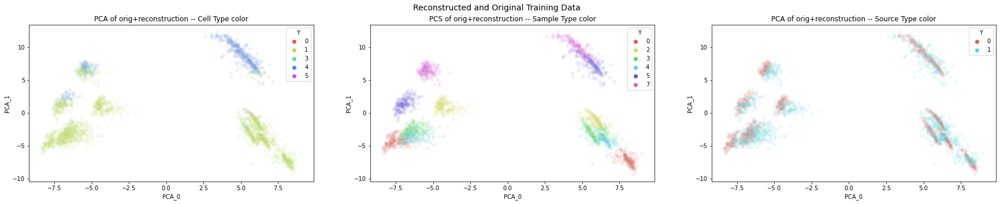

In [55]:
# make duplicated
X_dup = np.vstack([X_temp, decoded_outputs])


Y_dup = np.append(Y_temp, Y_temp)

label_dup = np.append(label_temp, label_temp)
perturb_dup = np.append(perturb_temp, perturb_temp)
source_dup = np.asarray(np.append([0]*1200, [1]*1200))

fig, axs = plt.subplots(1, 3, figsize=(30,5))

plot_df = vp.get_pca_for_plotting(np.asarray(X_dup))
vp.plot_pca(plot_df, color_vec=Y_dup, ax=axs[0], title="PCA of orig+reconstruction -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_dup, ax=axs[1], title="PCS of orig+reconstruction -- Sample Type color")
vp.plot_pca(plot_df, color_vec=source_dup, ax=axs[2], title="PCA of orig+reconstruction -- Source Type color")


fig.suptitle("Reconstructed and Original Training Data", fontsize=14)

fig.show()

### Plot latent spaces

In [56]:
len(idx_train)

2120

Number unique Y: 10


OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)


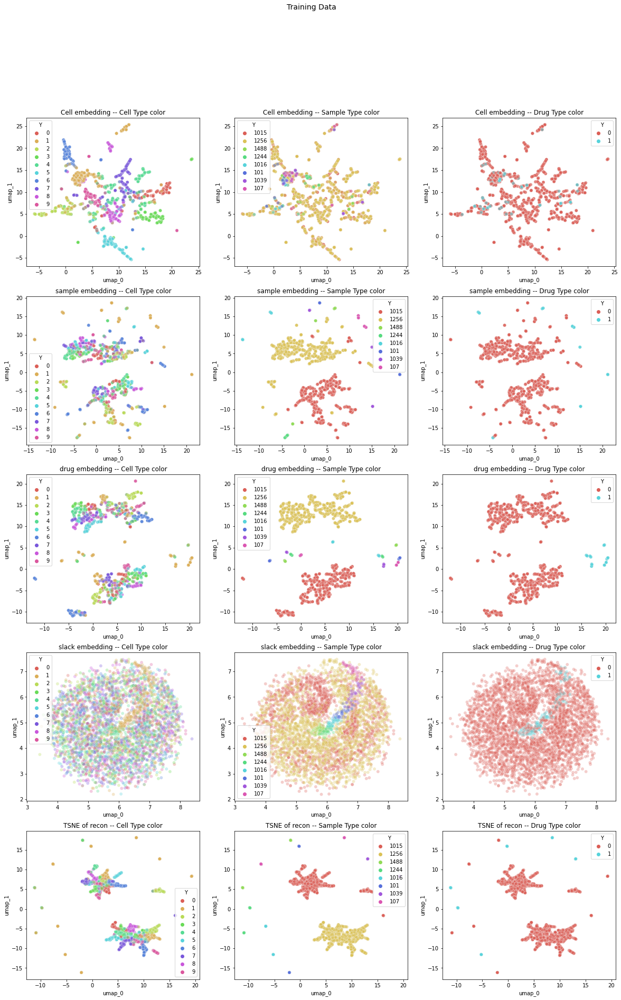

In [57]:
# plot proportions on labeled 10x and unlabeled 10x
# this is the training data

idx_tmp = np.repeat(idx_train, 2)[240:4240]

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]

print(f"Number unique Y: {len(np.unique(Y_temp))}")


z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)
prop_outputs = classifier.predict(X_temp, batch_size=batch_size)


# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)


fig, axs = plt.subplots(5, 3, figsize=(20,30))

plot_df = vp.get_umap_for_plotting(np.asarray(prop_outputs))
vp.plot_umap(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell embedding -- Cell Type color")
vp.plot_umap(plot_df, color_vec=label_temp, ax=axs[0,1], title="Cell embedding -- Sample Type color")
vp.plot_umap(plot_df, color_vec=perturb_temp, ax=axs[0,2], title="Cell embedding -- Drug Type color")

plot_df = vp.get_umap_for_plotting(np.asarray(mu_rot))
vp.plot_umap(plot_df, color_vec=Y_temp, ax=axs[1,0], title="sample embedding -- Cell Type color")
vp.plot_umap(plot_df, color_vec=label_temp, ax=axs[1,1], title="sample embedding -- Sample Type color")
vp.plot_umap(plot_df, color_vec=perturb_temp, ax=axs[1,2], title="sample embedding -- Drug Type color")

plot_df = vp.get_umap_for_plotting(np.asarray(mu_drug))
vp.plot_umap(plot_df, color_vec=Y_temp, ax=axs[2,0], title="drug embedding -- Cell Type color")
vp.plot_umap(plot_df, color_vec=label_temp, ax=axs[2,1], title="drug embedding -- Sample Type color")
vp.plot_umap(plot_df, color_vec=perturb_temp, ax=axs[2,2], title="drug embedding -- Drug Type color")

plot_df = vp.get_umap_for_plotting(np.asarray(mu_slack))
vp.plot_umap(plot_df, color_vec=Y_temp, ax=axs[3,0], title="slack embedding -- Cell Type color")
vp.plot_umap(plot_df, color_vec=label_temp, ax=axs[3,1], title="slack embedding -- Sample Type color")
vp.plot_umap(plot_df, color_vec=perturb_temp, ax=axs[3,2], title="slack embedding -- Drug Type color")

plot_df = vp.get_umap_for_plotting(np.asarray(decoded_outputs))
vp.plot_umap(plot_df, color_vec=Y_temp, ax=axs[4,0], title="TSNE of recon -- Cell Type color")
vp.plot_umap(plot_df, color_vec=label_temp, ax=axs[4,1], title="TSNE of recon -- Sample Type color")
vp.plot_umap(plot_df, color_vec=perturb_temp, ax=axs[4,2], title="TSNE of recon -- Drug Type color")




fig.suptitle("Training Data", fontsize=14)

fig.show()

Number unique Y: 10
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/decomposition/_pca.py:595: RuntimeWarning: divide by zero encountered in true_divide
  self.explained_variance_ratio_ = self.explained_variance_ / total_var.sum()


(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)


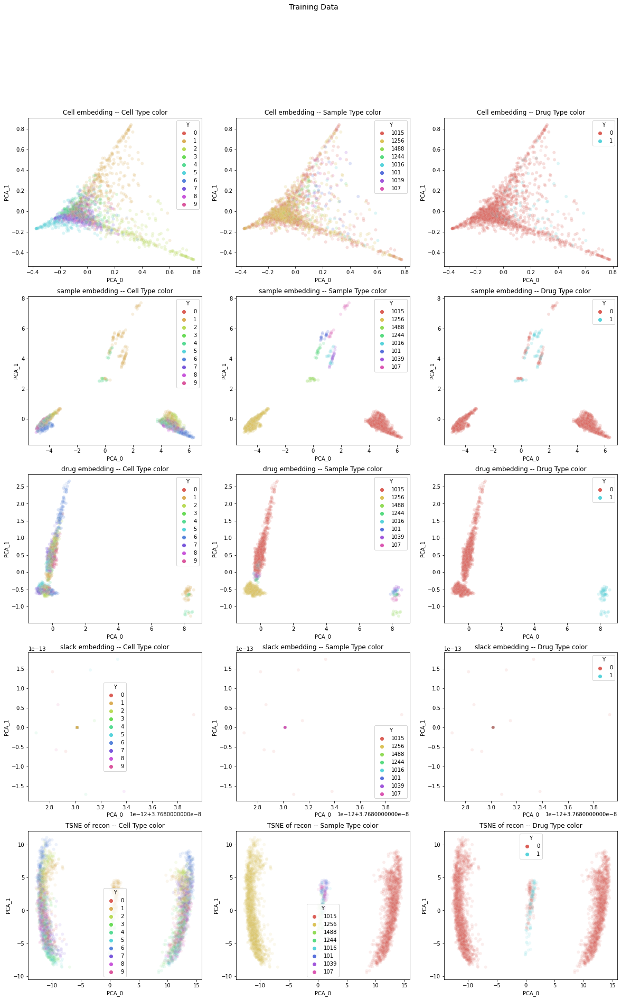

In [58]:
# plot proportions on labeled 10x and unlabeled 10x
# this is the training data
idx_tmp = np.tile(idx_train, 2)[240:4240]

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_full)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]
label_temp = index_label[label_temp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


print(f"Number unique Y: {len(np.unique(Y_temp))}")


z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)
prop_outputs = classifier.predict(X_temp, batch_size=batch_size)


# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)


fig, axs = plt.subplots(5, 3, figsize=(20,30))

plot_df = vp.get_pca_for_plotting(np.asarray(prop_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell embedding -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[0,1], title="Cell embedding -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[0,2], title="Cell embedding -- Drug Type color")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_rot))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[1,0], title="sample embedding -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,1], title="sample embedding -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[1,2], title="sample embedding -- Drug Type color")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_drug))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[2,0], title="drug embedding -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[2,1], title="drug embedding -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,2], title="drug embedding -- Drug Type color")

plot_df = vp.get_pca_for_plotting(np.asarray(mu_slack))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[3,0], title="slack embedding -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[3,1], title="slack embedding -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[3,2], title="slack embedding -- Drug Type color")

plot_df = vp.get_pca_for_plotting(np.asarray(decoded_outputs))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[4,0], title="TSNE of recon -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[4,1], title="TSNE of recon -- Sample Type color")
vp.plot_pca(plot_df, color_vec=perturb_temp, ax=axs[4,2], title="TSNE of recon -- Drug Type color")




fig.suptitle("Training Data", fontsize=14)

fig.show()

## Do latent space projectsions

### drug perturbation

In [60]:

idx_ctrl_test = np.logical_and(meta_df.stim == "CTRL", meta_df.isTraining == "Test")
idx_ctrl_test = np.where(idx_ctrl_test)[0]
len(idx_ctrl_test)

6600

In [61]:

idx_stim_test = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
idx_stim_test = np.where(idx_stim_test)[0]
len(idx_stim_test)

6600

In [164]:
"""def calc_buddi_perturbation(meta_df, X_full, scaler, classifier, encoder_unlab, decoder):

    # get the perturbation latent code
    idx_stim_test = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
    idx_stim_test = np.where(idx_stim_test)[0]
    stim_test_meta_df = meta_df.iloc[idx_stim_test]

    # duplicate to we have correct batch size
    len_stim_test = len(idx_stim_test)
    idx_stim_test = np.tile(idx_stim_test, 5)

    X_pert = np.copy(X_full)
    X_pert = X_pert[idx_stim_test,]

    prop_outputs = classifier.predict(X_pert, batch_size=batch_size)
    Y_pert = np.copy(prop_outputs)
    Y_pert = np.argmax(Y_pert, axis=1)

    z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug_perturb, mu_drug, l_sigma_drug = encoder_unlab.predict(X_pert, batch_size=batch_size)

    # get the original perturbation output
    z_concat_perturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug_perturb])
    decoded_1_1 = decoder.predict(z_concat_perturb, batch_size=batch_size)
    decoded_1_1 = scaler.inverse_transform(decoded_1_1)
    decoded_1_1 = decoded_1_1[range(len_stim_test),]

    # now get ctrl test cells
    idx_ctrl_test = np.logical_and(meta_df.stim == "CTRL", meta_df.isTraining == "Test")
    idx_ctrl_test = np.where(idx_ctrl_test)[0]
    ctrl_test_meta_df = meta_df.iloc[idx_ctrl_test]


    # duplicate to we have correct batch size
    len_ctrl_test = len(idx_ctrl_test)
    idx_ctrl_test = np.tile(idx_ctrl_test, 5)


    X_temp = np.copy(X_full)
    X_temp = X_temp[idx_ctrl_test,]

    prop_outputs = classifier.predict(X_temp, batch_size=batch_size)
    Y_temp = np.copy(prop_outputs)
    Y_temp = np.argmax(Y_temp, axis=1)

    # get the perturbation latent code

    # now get each of the latent codes
    z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

    # get the stim latent codes
    z_drug_perturb = z_drug_perturb[np.random.choice(z_drug_perturb.shape[0], X_temp.shape[0], replace=True)]


    # now concatenate together and add the stim codes to the latent
    z_concat_unlab_perturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug_perturb])
    decoded_0_1 = decoder.predict(z_concat_unlab_perturb, batch_size=batch_size)
    decoded_0_1 = scaler.inverse_transform(decoded_0_1)
    decoded_0_1 = decoded_0_1[range(len_stim_test),]

    # now concatenate together and add the stim codes to the latent
    z_concat_unlab_perturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug])
    decoded_0_0 = decoder.predict(z_concat_unlab_perturb, batch_size=batch_size)
    decoded_0_0 = scaler.inverse_transform(decoded_0_0)
    decoded_0_0 = decoded_0_0[range(len_ctrl_test),]

    return (stim_test_meta_df, ctrl_test_meta_df, decoded_1_1, decoded_0_1, decoded_0_0)

def subset_sample_celltype_perturbation(X_full, decoded_0_0, decoded_0_1, samp_interest, cell_prop_type, meta_df, ctrl_test_meta_df, cell_type_interest=None):

    # get the real data
    X_tmp = np.copy(X_full)
    X_tmp = scaler.inverse_transform(X_tmp)

    # get the ground truth
    real_stimulated_idx = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
    real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.cell_prop_type == cell_prop_type)
    real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.sample_id == samp_interest)

    if cell_type_interest is not None:
        real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.Y_max == cell_type_interest)
    real_stimulated_idx = np.where(real_stimulated_idx)[0]
    real_original_stim = X_tmp[real_stimulated_idx]


    real_ctrl_idx = np.logical_and(meta_df.stim == "CTRL", meta_df.isTraining == "Test")
    real_ctrl_idx = np.logical_and(real_ctrl_idx, meta_df.cell_prop_type == cell_prop_type)
    real_ctrl_idx = np.logical_and(real_ctrl_idx, meta_df.sample_id == samp_interest)
    if cell_type_interest is not None:
        real_ctrl_idx = np.logical_and(real_ctrl_idx, meta_df.Y_max == cell_type_interest)
    real_ctrl_idx = np.where(real_ctrl_idx)[0]
    real_original_ctrl = X_tmp[real_ctrl_idx]


    # get the reconstructed 
    recon_Zstim_idx = np.logical_and(ctrl_test_meta_df.stim == "CTRL", ctrl_test_meta_df.isTraining == "Test")
    recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.cell_prop_type == cell_prop_type)
    recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.sample_id == samp_interest)
    if cell_type_interest is not None:
        recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.Y_max == cell_type_interest)
    recon_Zstim_idx = np.where(recon_Zstim_idx)[0]
    projected_Zstimulated = decoded_0_1[recon_Zstim_idx]
    projected_ctrl = decoded_0_0[recon_Zstim_idx]

    return (real_original_stim, real_original_ctrl, projected_Zstimulated, projected_ctrl)


from sklearn.metrics import r2_score

def calc_expr_log2FC_r2(real_ctrl, real_stim, proj_ctrl, proj_stim):

    real_stim_med = np.median(real_stim, axis=0)
    proj_stim_med = np.median(proj_stim, axis=0)

    expr_r2 = pearsonr(real_stim_med, proj_stim_med)[0]


    real_ctrl = np.median(real_ctrl, axis=0)+1
    real_stim = np.median(real_stim, axis=0)+1
    real_log2FC = np.log2(real_stim/real_ctrl)

    proj_ctrl = np.median(proj_ctrl, axis=0)+1
    proj_stim = np.median(proj_stim, axis=0)+1
    proj_log2FC = np.log2(proj_stim/proj_ctrl)


    log2FC_r2 = pearsonr(real_log2FC, proj_log2FC)[0]

    return (expr_r2, log2FC_r2)


def get_TP_FP_DE_genes(projected_Zstimulated, projected_ctrl, DE_table, gene_cutoff=100, pvalue_cutoff=0.01):
    test_res = ttest_ind(projected_Zstimulated, projected_ctrl)
    top_test_res = union_genes[np.argsort(test_res.pvalue)[0:gene_cutoff]]

    DE_table = DE_table.sort_values(by=['padj'])
    DE_table.gene_symbol.to_list()[0:gene_cutoff]

    num_intersect_genes = len(np.intersect1d(top_test_res, DE_table))

    num_DE = len(np.where(test_res.pvalue < pvalue_cutoff)[0])

    return(num_intersect_genes, num_DE)
"""




In [175]:

# run first the cell_type specific things

cell_type_specific_r2 = None
all_samps = ['101', '1016', '1039', '107', '1244', '1488']

stim_test_meta_df, ctrl_test_meta_df, decoded_1_1, decoded_0_1, decoded_0_0 = vp.calc_buddi_perturbation(meta_df, X_full, scaler, classifier, encoder_unlab, decoder, batch_size)


for curr_samp in all_samps:
    print(curr_samp)
    for curr_cell_type in Y_full.columns:
        print(curr_cell_type)

        real_stim, real_ctrl, proj_stim, proj_ctrl = vp.subset_sample_celltype_perturbation(X_full, decoded_0_0, 
                                                                                        decoded_0_1, scaler, curr_samp, 
                                                                                        "cell_type_specific", 
                                                                                        meta_df, ctrl_test_meta_df,
                                                                                        curr_cell_type)

        expr_r2, log2FC_r2 = vp.calc_expr_log2FC_r2(real_ctrl, real_stim, proj_ctrl, proj_stim)

        curr_res = [curr_samp, curr_cell_type, "cell_type_specific", expr_r2, log2FC_r2]
        curr_res = pd.DataFrame([curr_res],  columns = ['sample_id', 'cell_type', 'bulk_type', 'expr_r2', 'log2FC_r2'])

        if cell_type_specific_r2 is None:
            cell_type_specific_r2 = curr_res
        else:
             cell_type_specific_r2 = cell_type_specific_r2.append(curr_res)



# now run the realistic ones

101
B
CD14_Mono
CD16_Mono
CD4_Mem_T
CD4_Naive_T
CD8_T
DC
Mk
NK
T_Act
1016
B
CD14_Mono
CD16_Mono
CD4_Mem_T
CD4_Naive_T
CD8_T
DC
Mk
NK
T_Act
1039
B
CD14_Mono
CD16_Mono
CD4_Mem_T
CD4_Naive_T
CD8_T
DC
Mk
NK
T_Act
107
B
CD14_Mono
CD16_Mono
CD4_Mem_T
CD4_Naive_T
CD8_T
DC
Mk
NK
T_Act
1244
B
CD14_Mono
CD16_Mono
CD4_Mem_T
CD4_Naive_T
CD8_T
DC
Mk
NK
T_Act
1488
B
CD14_Mono
CD16_Mono
CD4_Mem_T
CD4_Naive_T
CD8_T
DC
Mk
NK
T_Act


In [176]:
realistic_r2 = None

stim_test_meta_df, ctrl_test_meta_df, decoded_1_1, decoded_0_1, decoded_0_0 = vp.calc_buddi_perturbation(meta_df, X_full, scaler, classifier, encoder_unlab, decoder, batch_size)

for curr_samp in all_samps:

        real_stim, real_ctrl, proj_stim, proj_ctrl = vp.subset_sample_celltype_perturbation(X_full, decoded_0_0, 
                                                                                        decoded_0_1, scaler, curr_samp, 
                                                                                        "realistic", 
                                                                                        meta_df, ctrl_test_meta_df,
                                                                                        cell_type_interest=None)

        expr_r2, log2FC_r2 = vp.calc_expr_log2FC_r2(real_ctrl, real_stim, proj_ctrl, proj_stim)

        curr_res = [curr_samp, None, "realistic", expr_r2, log2FC_r2]
        curr_res = pd.DataFrame([curr_res],  columns = ['sample_id', 'cell_type', 'bulk_type', 'expr_r2', 'log2FC_r2'])

        if realistic_r2 is None:
            realistic_r2 = curr_res
        else:
             realistic_r2 = realistic_r2.append(curr_res)

In [177]:
final_r = cell_type_specific_r2.append(realistic_r2)
pearson_res_file = os.path.join(res_data_path, f"{exp_id}_pearson_matr.csv")
final_r.to_csv(pearson_res_file, index=False)


# ** THIS IS WHERE I LEFT OFF **

In [160]:
num_intersect_genes, num_DE = vp.get_TP_FP_DE_genes(projected_Zstimulated, projected_ctrl, DE_table, gene_cutoff=100, pvalue_cutoff=0.01)


expr 0.9154911020225349, log2Fc 0.31594322044413337


In [ ]:
stim_test_meta_df, ctrl_test_meta_df, decoded_1_1, decoded_0_1, decoded_0_0 = calc_buddi_perturbation(meta_df, X_full, scaler, classifier, encoder_unlab, decoder)


# get the real data
X_tmp = np.copy(X_full)
X_tmp = scaler.inverse_transform(X_tmp)

samp_interest = "1039"
cell_type_interest = "CD14_Mono"

# get the ground truth
real_stimulated_idx = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.cell_prop_type == "cell_type_specific")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.sample_id == samp_interest)
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.Y_max == cell_type_interest)
real_stimulated_idx = np.where(real_stimulated_idx)[0]
real_original_stim = X_tmp[real_stimulated_idx]


real_ctrl_idx = np.logical_and(meta_df.stim == "CTRL", meta_df.isTraining == "Test")
real_ctrl_idx = np.logical_and(real_ctrl_idx, meta_df.cell_prop_type == "cell_type_specific")
real_ctrl_idx = np.logical_and(real_ctrl_idx, meta_df.sample_id == samp_interest)
real_ctrl_idx = np.logical_and(real_ctrl_idx, meta_df.Y_max == cell_type_interest)
real_ctrl_idx = np.where(real_ctrl_idx)[0]
real_original_ctrl = X_tmp[real_ctrl_idx]


# get the reconstructed 
recon_Zstim_idx = np.logical_and(ctrl_test_meta_df.stim == "CTRL", ctrl_test_meta_df.isTraining == "Test")
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.cell_prop_type == "cell_type_specific")
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.sample_id == samp_interest)
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.Y_max == cell_type_interest)
recon_Zstim_idx = np.where(recon_Zstim_idx)[0]
projected_Zstimulated = decoded_0_1[recon_Zstim_idx]
projected_ctrl = decoded_0_0[recon_Zstim_idx]



In [85]:
# get the perturbation latent code
idx_stim_test = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
idx_stim_test = np.where(idx_stim_test)[0]
stim_test_meta_df = meta_df.iloc[idx_stim_test]

# duplicate to we have correct batch size
len_stim_test = len(idx_stim_test)
idx_stim_test = np.tile(idx_stim_test, 5)

X_pert = np.copy(X_full)
X_pert = X_pert[idx_stim_test,]

prop_outputs = classifier.predict(X_pert, batch_size=batch_size)
Y_pert = np.copy(prop_outputs)
Y_pert = np.argmax(Y_pert, axis=1)

z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug_perturb, mu_drug, l_sigma_drug = encoder_unlab.predict(X_pert, batch_size=batch_size)

# get the original perturbation output
z_concat_perturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug_perturb])
decoded_1_1 = decoder.predict(z_concat_perturb, batch_size=batch_size)
decoded_1_1 = scaler.inverse_transform(decoded_1_1)
decoded_1_1 = decoded_1_1[range(len_stim_test),]

# now get ctrl test cells
idx_ctrl_test = np.logical_and(meta_df.stim == "CTRL", meta_df.isTraining == "Test")
idx_ctrl_test = np.where(idx_ctrl_test)[0]
ctrl_test_meta_df = meta_df.iloc[idx_ctrl_test]


# duplicate to we have correct batch size
len_ctrl_test = len(idx_ctrl_test)
idx_ctrl_test = np.tile(idx_ctrl_test, 5)


X_temp = np.copy(X_full)
X_temp = X_temp[idx_ctrl_test,]

prop_outputs = classifier.predict(X_temp, batch_size=batch_size)
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

# get the perturbation latent code

# now get each of the latent codes
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

# get the stim latent codes
z_drug_perturb = z_drug_perturb[np.random.choice(z_drug_perturb.shape[0], X_temp.shape[0], replace=True)]


# now concatenate together and add the stim codes to the latent
z_concat_unlab_perturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug_perturb])
decoded_0_1 = decoder.predict(z_concat_unlab_perturb, batch_size=batch_size)
decoded_0_1 = scaler.inverse_transform(decoded_0_1)
decoded_0_1 = decoded_0_1[range(len_stim_test),]

# now concatenate together and add the stim codes to the latent
z_concat_unlab_perturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug])
decoded_0_0 = decoder.predict(z_concat_unlab_perturb, batch_size=batch_size)
decoded_0_0 = scaler.inverse_transform(decoded_0_0)
decoded_0_0 = decoded_0_0[range(len_stim_test),]




In [63]:
def plot_expr_corr(xval, yval, ax, title, xlab, ylab, class_id, max_val=2700, min_val=0, alpha=0.5):

    plot_df = pd.DataFrame(list(zip(xval, yval)))
    plot_df.columns = [xlab, ylab]

    g = sns.scatterplot(
        x=xlab, y=ylab,
        data=plot_df,ax=ax,
        hue=class_id,
        alpha= alpha
    )
    g.set(ylim=(min_val, max_val))
    g.set(xlim=(min_val, max_val))
    g.plot([min_val, max_val], [min_val, max_val], transform=g.transAxes)


    ax.set_title(title)
    return g

def plot_MA(xval, yval, ax, title, xlab, ylab, class_id, max_val=2700, min_val=0, alpha=0.5):

    plot_df = pd.DataFrame(list(zip(xval, yval)))
    plot_df.columns = [xlab, ylab]

    g = sns.scatterplot(
        x=xlab, y=ylab,
        data=plot_df,ax=ax,
        hue=class_id,
        alpha=alpha
    )
    g.set(ylim=(min_val, max_val))
    g.set(xlim=(min_val, max_val))


    ax.set_title(title)
    return g


In [110]:

# get the real data
X_tmp = np.copy(X_full)
X_tmp = scaler.inverse_transform(X_tmp)

samp_interest = "1039"
cell_type_interest = "CD14_Mono"

# get the ground truth
real_stimulated_idx = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.cell_prop_type == "cell_type_specific")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.sample_id == samp_interest)
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.Y_max == cell_type_interest)
real_stimulated_idx = np.where(real_stimulated_idx)[0]
real_original_stim = X_tmp[real_stimulated_idx]


real_ctrl_idx = np.logical_and(meta_df.stim == "CTRL", meta_df.isTraining == "Test")
real_ctrl_idx = np.logical_and(real_ctrl_idx, meta_df.cell_prop_type == "cell_type_specific")
real_ctrl_idx = np.logical_and(real_ctrl_idx, meta_df.sample_id == samp_interest)
real_ctrl_idx = np.logical_and(real_ctrl_idx, meta_df.Y_max == cell_type_interest)
real_ctrl_idx = np.where(real_ctrl_idx)[0]
real_original_ctrl = X_tmp[real_ctrl_idx]


# get the reconstructed 
recon_Zstim_idx = np.logical_and(ctrl_test_meta_df.stim == "CTRL", ctrl_test_meta_df.isTraining == "Test")
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.cell_prop_type == "cell_type_specific")
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.sample_id == samp_interest)
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.Y_max == cell_type_interest)
recon_Zstim_idx = np.where(recon_Zstim_idx)[0]
projected_Zstimulated = decoded_0_1[recon_Zstim_idx]
projected_ctrl = decoded_0_0[recon_Zstim_idx]




In [111]:
a = ttest_ind(projected_Zstimulated, projected_ctrl)
union_genes[np.argsort(a.pvalue)[0:100]]

array(['IFIT1', 'HES4', 'CXCL11', 'OAS1', 'IFIT2', 'GPR141', 'MX2',
       'TBXAS1', 'RSAD2', 'RP11-154H23.3', 'TNFSF10', 'GBP4', 'DHX16',
       'OASL', 'TNFSF13B', 'EIF2AK2', 'NMI', 'SAMD9L', 'FAM46A', 'EIF2S2',
       'AKT1S1', 'IL1RN', 'PARP14', 'RP11-701P16.5', 'GBP3', 'RABAC1',
       'DRAP1', 'SMCHD1', 'SP110', 'CLDN23', 'TNFAIP6', 'IFI35', 'NUDT3',
       'NT5C3A', 'WSB1', 'PITPNA', 'ATG12', 'GBP1', 'RABGAP1L', 'SAMHD1',
       'CHORDC1', 'TRAM1', 'RNF149', 'GBP5', 'MMP14', 'CHD2', 'CD80',
       'IFIH1', 'MTSS1', 'GLTP', 'NCOA4', 'HADHA', 'CBWD5', 'CBWD2',
       'XAF1', 'APOL3', 'DPH3', 'HERC5', 'UBXN11', 'IFI44', 'CNIH2',
       'TCTEX1D2', 'CD38', 'ITGB7', 'RTP4', 'CYTH2', 'MX1', 'CCL18',
       'UBE2F', 'PARP4', 'TMEM219', 'TRAPPC3', 'MRPL22', 'POR', 'NRIP3',
       'TAX1BP1', 'TRADD', 'HM13', 'SLC9A3R2', 'REEP4', 'NSFL1C',
       'SRD5A1', 'SMIM14', 'CHMP4A', 'MARVELD1', 'TMEM88', 'PSMB8',
       'NAPRT1', 'HK1', 'ARF6', 'CMPK2', 'CBWD1', 'CD164', 'NABP1',
       'PITPNM1

In [121]:
# read in the table
DE_table = pd.read_table(de_res_path)
de_idx = np.where(DE_table.cell_type == cell_type_interest)[0]


DE_table_top = DE_table.iloc[de_idx]
DE_table_top = DE_table_top.sort_values(by=['padj'])
DE_table_top.gene_symbol.to_list()[0:100]


['IFITM2',
 'SSB',
 'NT5C3A',
 'IL1RN',
 'RABGAP1L',
 'DDX58',
 'RTCB',
 'DYNLT1',
 'ISG20',
 'PSMA4',
 'TMEM50A',
 'CMPK2',
 'PLSCR1',
 'OASL',
 'EIF2AK2',
 'NAPA',
 'NMI',
 'IRF7',
 'TMSB10',
 'DRAP1',
 'SAMD9',
 'GBP4',
 'SP110',
 'SAMD9L',
 'IFIH1',
 'DEFB1',
 'HERC5',
 'IL27',
 'NADK',
 'SNX10',
 'MT2A',
 'SERPING1',
 'ATG3',
 'BLVRA',
 'IFI16',
 'SOCS1',
 'SPATS2L',
 'TMEM123',
 'RTP4',
 'PARP9',
 'CD38',
 'CCL8',
 'PSMA2',
 'STOM',
 'VCAN',
 'C19orf66',
 'SNX3',
 'PPM1K',
 'IFI35',
 'HSPB1',
 'RAB8A',
 'OAS3',
 'DHX58',
 'MB21D1',
 'HSPA1A',
 'IFIT1',
 'IFIT3',
 'MYL12A',
 'PARP12',
 'TRADD',
 'IFITM1',
 'GBP1',
 'GCH1',
 'BAG1',
 'VAMP5',
 'TREX1',
 'HES4',
 'BST2',
 'CD164',
 'TRIM22',
 'OPTN',
 'HLA-E',
 'OAS2',
 'PHF11',
 'SNX6',
 'MX1',
 'EPSTI1',
 'CD47',
 'FBXO6',
 'CXCL11',
 'SNN',
 'IFIT2',
 'SLC31A2',
 'GNG5',
 'TNFSF13B',
 'BLZF1',
 'HERC6',
 'KLF6',
 'ANKRD22',
 'CD69',
 'TFEC',
 'STAT2',
 'SAT2',
 'UBE2L6',
 'SNX2',
 'IRF2',
 'SP140',
 'ADAR',
 'BAZ1A',
 'NAGK']

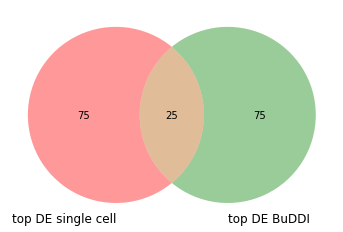

In [126]:

venn2([set(DE_table_top.gene_symbol.to_list()[0:100]), set(union_genes[np.argsort(a.pvalue)[0:100]])], set_labels = ('top DE single cell', 'top DE BuDDI'))
plt.show()

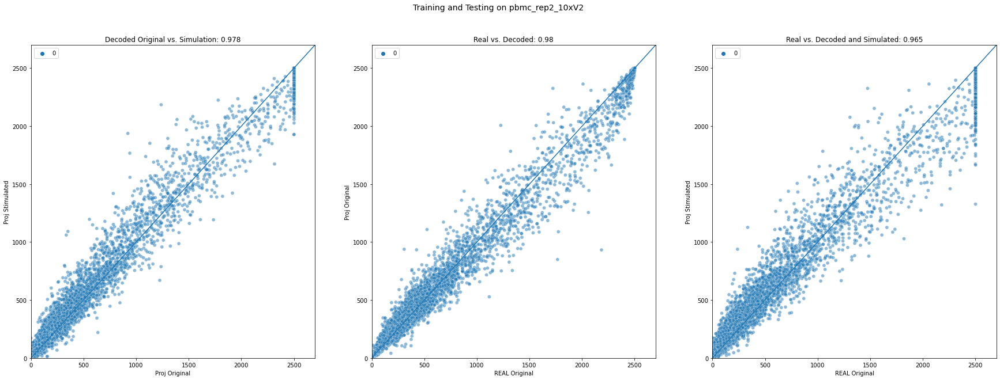

In [68]:


# get the real data
X_tmp = np.copy(X_full)
X_tmp = scaler.inverse_transform(X_tmp)

samp_interest = "1039"

real_stimulated_idx = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.cell_prop_type == "realistic")
real_stimulated_idx = np.where(real_stimulated_idx)[0]
real_original = X_tmp[real_stimulated_idx]

# get the reconstructed real simulation
recon_stimulated_idx = np.logical_and(stim_test_meta_df.stim == "STIM", stim_test_meta_df.isTraining == "Test")
recon_stimulated_idx = np.logical_and(recon_stimulated_idx, stim_test_meta_df.cell_prop_type == "realistic")
recon_stimulated_idx = np.where(recon_stimulated_idx)[0]
projected_stimulated = decoded_1_1[recon_stimulated_idx]

# get the reconstructed FAKE simulation
recon_Zstim_idx = np.logical_and(ctrl_test_meta_df.stim == "CTRL", ctrl_test_meta_df.isTraining == "Test")
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.cell_prop_type == "realistic")
recon_Zstim_idx = np.where(recon_Zstim_idx)[0]
projected_Zstimulated = decoded_0_1[recon_Zstim_idx]

real_original = np.median(real_original, axis=0)
projected_stimulated = np.median(projected_stimulated, axis=0)
projected_Zstimulated = np.median(projected_Zstimulated, axis=0)

class_color = [0]*len(projected_stimulated)

fig, axs = plt.subplots(1, 3, figsize=(30,10))

CoD_real_proj = np.round(r2_score(real_original, projected_stimulated), 3)
CoD_proj_projZ = np.round(r2_score(projected_stimulated, projected_Zstimulated), 3)
CoD_real_projZ = np.round(r2_score(real_original, projected_Zstimulated), 3)

plot_expr_corr(real_original, projected_stimulated, axs[0], title=f"Decoded Original vs. Simulation: {CoD_real_proj}", xlab="Proj Original", ylab="Proj Stimulated", class_id=class_color)
plot_expr_corr(projected_stimulated, projected_Zstimulated, axs[1], title=f"Real vs. Decoded: {CoD_proj_projZ}", xlab="REAL Original", ylab="Proj Original", class_id=class_color)
plot_expr_corr(real_original, projected_Zstimulated, axs[2], title=f"Real vs. Decoded and Simulated: {CoD_real_projZ}", xlab="REAL Original", ylab="Proj Stimulated", class_id=class_color)


fig.suptitle("Training and Testing on pbmc_rep2_10xV2", fontsize=14)

fig.show()

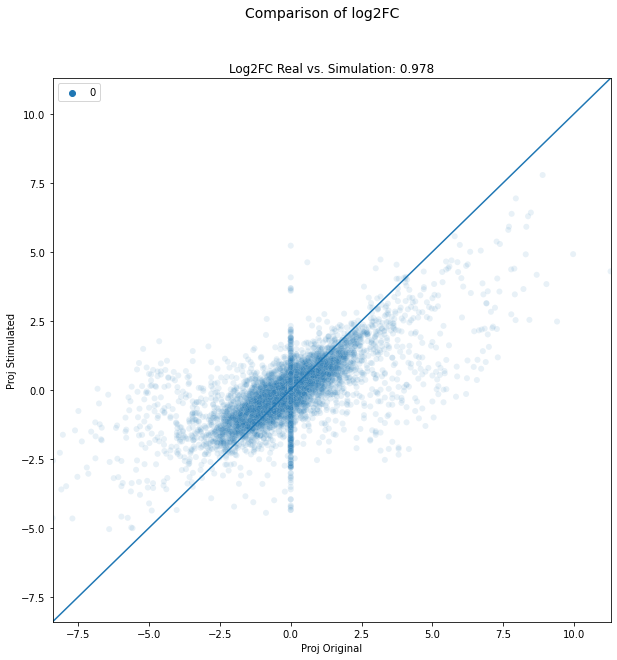

In [69]:
from sklearn.metrics import r2_score


# get the real data
X_tmp = np.copy(X_full)
X_tmp = scaler.inverse_transform(X_tmp)


real_stimulated_idx = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.cell_prop_type == "realistic")
real_stimulated_idx = np.where(real_stimulated_idx)[0]
real_original_stim = X_tmp[real_stimulated_idx]


real_stimulated_idx = np.logical_and(meta_df.stim == "CTRL", meta_df.isTraining == "Test")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.cell_prop_type == "realistic")
real_stimulated_idx = np.where(real_stimulated_idx)[0]
real_original_ctrl = X_tmp[real_stimulated_idx]


# get the reconstructed FAKE simulation
recon_Zstim_idx = np.logical_and(ctrl_test_meta_df.stim == "CTRL", ctrl_test_meta_df.isTraining == "Test")
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.cell_prop_type == "realistic")
recon_Zstim_idx = np.where(recon_Zstim_idx)[0]
projected_Zstimulated = decoded_0_1[recon_Zstim_idx]
projected_ctrl = decoded_0_0[recon_Zstim_idx]

real_original_stim = np.median(real_original_stim, axis=0)+1
real_original_ctrl = np.median(real_original_ctrl, axis=0)+1
real_log2FC = np.log2(real_original_stim/real_original_ctrl)

projected_ctrl = np.median(projected_ctrl, axis=0)+1
projected_Zstimulated = np.median(projected_Zstimulated, axis=0)+1
proj_log2FC = np.log2(projected_Zstimulated/projected_ctrl)

class_color = [0]*len(proj_log2FC)

fig, axs = plt.subplots(1, 1, figsize=(10,10))

CoD_log2FC = np.round(r2_score(real_log2FC, proj_log2FC), 3)

max_val = np.max([np.max(real_log2FC), np.max(proj_log2FC)])
min_val = np.min([np.min(real_log2FC), np.min(proj_log2FC)])
plot_expr_corr(real_log2FC, proj_log2FC, axs, title=f"Log2FC Real vs. Simulation: {CoD_real_proj}", xlab="Proj Original", ylab="Proj Stimulated", class_id=class_color, max_val=max_val, min_val=min_val, alpha=0.1)


fig.suptitle("Comparison of log2FC", fontsize=14)

fig.show()

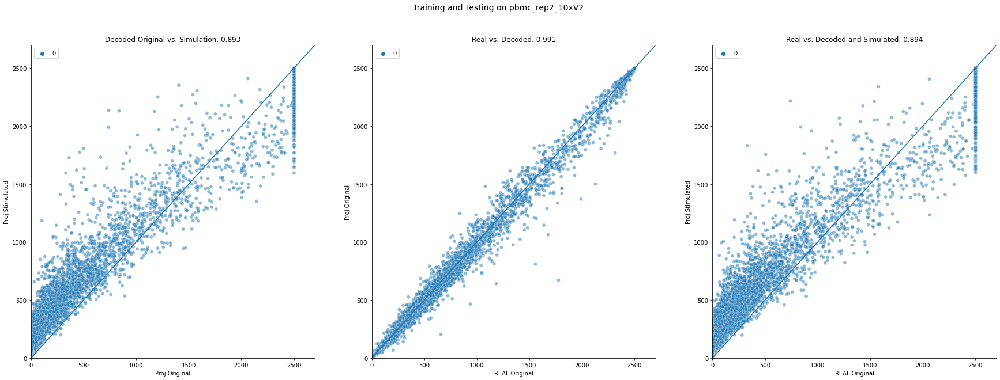

In [70]:
from sklearn.metrics import r2_score


# get the real data
X_tmp = np.copy(X_full)
X_tmp = scaler.inverse_transform(X_tmp)

samp_interest = "1039"

real_stimulated_idx = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.cell_prop_type == "cell_type_specific")
real_stimulated_idx = np.where(real_stimulated_idx)[0]
real_original = X_tmp[real_stimulated_idx]

# get the reconstructed real simulation
recon_stimulated_idx = np.logical_and(stim_test_meta_df.stim == "STIM", stim_test_meta_df.isTraining == "Test")
recon_stimulated_idx = np.logical_and(recon_stimulated_idx, stim_test_meta_df.cell_prop_type == "cell_type_specific")
recon_stimulated_idx = np.where(recon_stimulated_idx)[0]
projected_stimulated = decoded_1_1[recon_stimulated_idx]

# get the reconstructed FAKE simulation
recon_Zstim_idx = np.logical_and(ctrl_test_meta_df.stim == "CTRL", ctrl_test_meta_df.isTraining == "Test")
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.cell_prop_type == "cell_type_specific")
recon_Zstim_idx = np.where(recon_Zstim_idx)[0]
projected_Zstimulated = decoded_0_1[recon_Zstim_idx]

real_original = np.median(real_original, axis=0)
projected_stimulated = np.median(projected_stimulated, axis=0)
projected_Zstimulated = np.median(projected_Zstimulated, axis=0)

class_color = [0]*len(projected_stimulated)

fig, axs = plt.subplots(1, 3, figsize=(30,10))

CoD_real_proj = np.round(r2_score(real_original, projected_stimulated), 3)
CoD_proj_projZ = np.round(r2_score(projected_stimulated, projected_Zstimulated), 3)
CoD_real_projZ = np.round(r2_score(real_original, projected_Zstimulated), 3)

plot_expr_corr(real_original, projected_stimulated, axs[0], title=f"Decoded Original vs. Simulation: {CoD_real_proj}", xlab="Proj Original", ylab="Proj Stimulated", class_id=class_color)
plot_expr_corr(projected_stimulated, projected_Zstimulated, axs[1], title=f"Real vs. Decoded: {CoD_proj_projZ}", xlab="REAL Original", ylab="Proj Original", class_id=class_color)
plot_expr_corr(real_original, projected_Zstimulated, axs[2], title=f"Real vs. Decoded and Simulated: {CoD_real_projZ}", xlab="REAL Original", ylab="Proj Stimulated", class_id=class_color)


fig.suptitle("Training and Testing on pbmc_rep2_10xV2", fontsize=14)

fig.show()

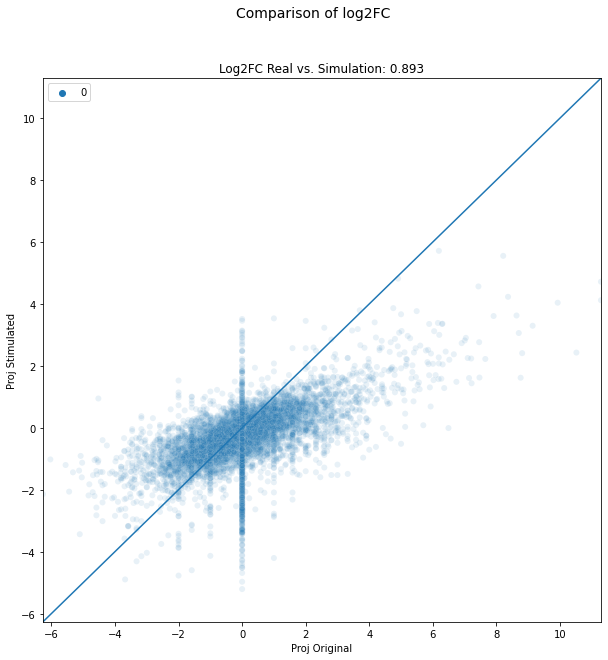

In [71]:
from sklearn.metrics import r2_score


# get the real data
X_tmp = np.copy(X_full)
X_tmp = scaler.inverse_transform(X_tmp)


real_stimulated_idx = np.logical_and(meta_df.stim == "STIM", meta_df.isTraining == "Test")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.cell_prop_type == "cell_type_specific")
real_stimulated_idx = np.where(real_stimulated_idx)[0]
real_original_stim = X_tmp[real_stimulated_idx]


real_stimulated_idx = np.logical_and(meta_df.stim == "CTRL", meta_df.isTraining == "Test")
real_stimulated_idx = np.logical_and(real_stimulated_idx, meta_df.cell_prop_type == "cell_type_specific")
real_stimulated_idx = np.where(real_stimulated_idx)[0]
real_original_ctrl = X_tmp[real_stimulated_idx]


# get the reconstructed FAKE simulation
recon_Zstim_idx = np.logical_and(ctrl_test_meta_df.stim == "CTRL", ctrl_test_meta_df.isTraining == "Test")
recon_Zstim_idx = np.logical_and(recon_Zstim_idx, ctrl_test_meta_df.cell_prop_type == "cell_type_specific")
recon_Zstim_idx = np.where(recon_Zstim_idx)[0]
projected_Zstimulated = decoded_0_1[recon_Zstim_idx]
projected_ctrl = decoded_0_0[recon_Zstim_idx]

real_original_stim = np.median(real_original_stim, axis=0)+1
real_original_ctrl = np.median(real_original_ctrl, axis=0)+1
real_log2FC = np.log2(real_original_stim/real_original_ctrl)

projected_ctrl = np.median(projected_ctrl, axis=0)+1
projected_Zstimulated = np.median(projected_Zstimulated, axis=0)+1
proj_log2FC = np.log2(projected_Zstimulated/projected_ctrl)

class_color = [0]*len(proj_log2FC)

fig, axs = plt.subplots(1, 1, figsize=(10,10))

CoD_log2FC = np.round(r2_score(real_log2FC, proj_log2FC), 3)

max_val = np.max([np.max(real_log2FC), np.max(proj_log2FC)])
min_val = np.min([np.min(real_log2FC), np.min(proj_log2FC)])
plot_expr_corr(real_log2FC, proj_log2FC, axs, title=f"Log2FC Real vs. Simulation: {CoD_real_proj}", xlab="Proj Original", ylab="Proj Stimulated", class_id=class_color, max_val=max_val, min_val=min_val, alpha=0.1)


fig.suptitle("Comparison of log2FC", fontsize=14)

fig.show()

In [72]:
# Plot all patients

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

proj_temp = np.array([0]*len(Y_temp)) # ["other"]*len(Y_temp)

idx_proj_cell0 = np.where(np.logical_and(perturb_temp == 0, np.logical_and(Y_temp == 5, label_temp == 5)))[0]
idx_reg_cell0 = np.where(np.logical_and(perturb_temp == 1, np.logical_and(Y_temp == 5, label_temp == 5)))[0]

proj_temp[idx_proj_cell0] = 1 #"cell0 samp 0"
proj_temp[idx_reg_cell0] = 2 #"cell0 samp 1"


only_cell_0_interest = np.union1d(idx_proj_cell0, idx_reg_cell0)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

plot_df = vp.get_umap_for_plotting(np.asarray(decoded_0_0))
vp.plot_umap(plot_df, color_vec=Y_temp, ax=axs[0,0], title="TSNE of decoded -- Cell Type color")
vp.plot_umap(plot_df, color_vec=label_temp, ax=axs[0,1], title="TSNE of decoded -- Sample Type color")
vp.plot_umap(plot_df, color_vec=proj_temp, ax=axs[0,2], title="TSNE of decoded -- Proj color", alpha=0.01)
vp.plot_umap(plot_df.iloc[only_cell_0_interest], color_vec=proj_temp[only_cell_0_interest], ax=axs[0,2], title="TSNE of decoded -- Proj color")

plot_df = vp.get_umap_for_plotting(np.asarray(decoded_0_1))
vp.plot_umap(plot_df, color_vec=Y_temp, ax=axs[1,0], title="TSNE of decoded_shift -- Cell Type color")
vp.plot_umap(plot_df, color_vec=label_temp, ax=axs[1,1], title="TSNE of decoded_shift -- Sample Type color")
vp.plot_umap(plot_df, color_vec=proj_temp, ax=axs[1,2], title="TSNE of decoded_shift -- Proj color", alpha=0.01)
vp.plot_umap(plot_df.iloc[only_cell_0_interest], color_vec=proj_temp[only_cell_0_interest], ax=axs[1,2], title="TSNE of decoded_shift -- Proj color")


fig.suptitle("Training Data", fontsize=14)

fig.show()



ValueError: operands could not be broadcast together with shapes (33000,) (15320,) 

(16000, 2)
(16000, 2)


/tmp/ipykernel_16169/4280157301.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec


(16000, 2)
(16000, 2)


/tmp/ipykernel_16169/4280157301.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec


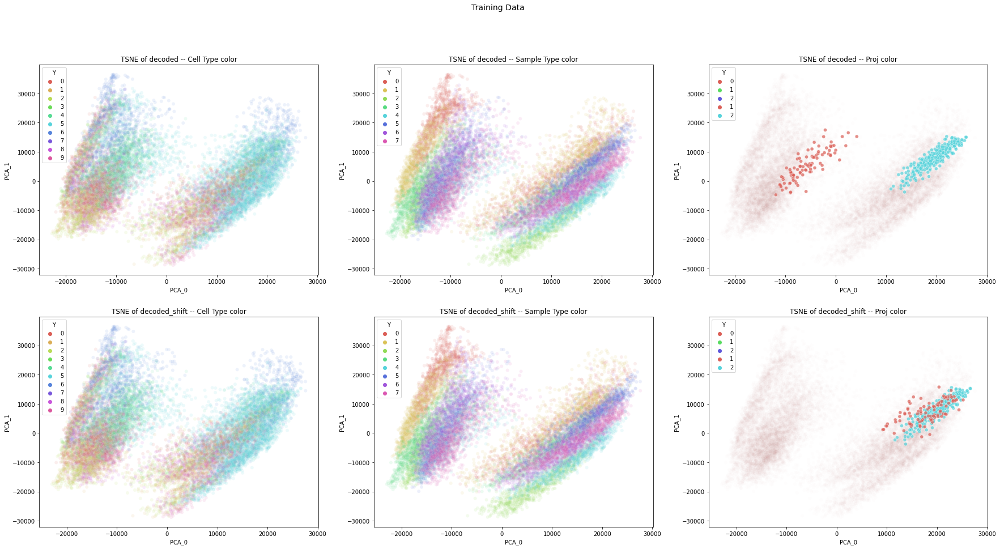

In [ ]:
# Plot all patients

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

proj_temp = np.array([0]*len(Y_temp)) # ["other"]*len(Y_temp)

idx_proj_cell0 = np.where(np.logical_and(perturb_temp == 0, np.logical_and(Y_temp == 5, label_temp == 5)))[0]
idx_reg_cell0 = np.where(np.logical_and(perturb_temp == 1, np.logical_and(Y_temp == 5, label_temp == 5)))[0]

proj_temp[idx_proj_cell0] = 1 #"cell0 samp 0"
proj_temp[idx_reg_cell0] = 2 #"cell0 samp 1"


only_cell_0_interest = np.union1d(idx_proj_cell0, idx_reg_cell0)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

plot_df = vp.get_pca_for_plotting(np.asarray(decoded_0_0))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="TSNE of decoded -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[0,1], title="TSNE of decoded -- Sample Type color")
vp.plot_pca(plot_df, color_vec=proj_temp, ax=axs[0,2], title="TSNE of decoded -- Proj color", alpha=0.01)
vp.plot_pca(plot_df.iloc[only_cell_0_interest], color_vec=proj_temp[only_cell_0_interest], ax=axs[0,2], title="TSNE of decoded -- Proj color", alpha=0.7)

plot_df = vp.get_pca_for_plotting(np.asarray(decoded_0_1))
vp.plot_pca(plot_df, color_vec=Y_temp, ax=axs[1,0], title="TSNE of decoded_shift -- Cell Type color")
vp.plot_pca(plot_df, color_vec=label_temp, ax=axs[1,1], title="TSNE of decoded_shift -- Sample Type color")
vp.plot_pca(plot_df, color_vec=proj_temp, ax=axs[1,2], title="TSNE of decoded_shift -- Proj color", alpha=0.01)
vp.plot_pca(plot_df.iloc[only_cell_0_interest], color_vec=proj_temp[only_cell_0_interest], ax=axs[1,2], title="TSNE of decoded_shift -- Proj color", alpha=0.7)


fig.suptitle("Training Data", fontsize=14)

fig.show()



(2000, 2)
(2000, 2)
(2000, 2)
(2000, 2)


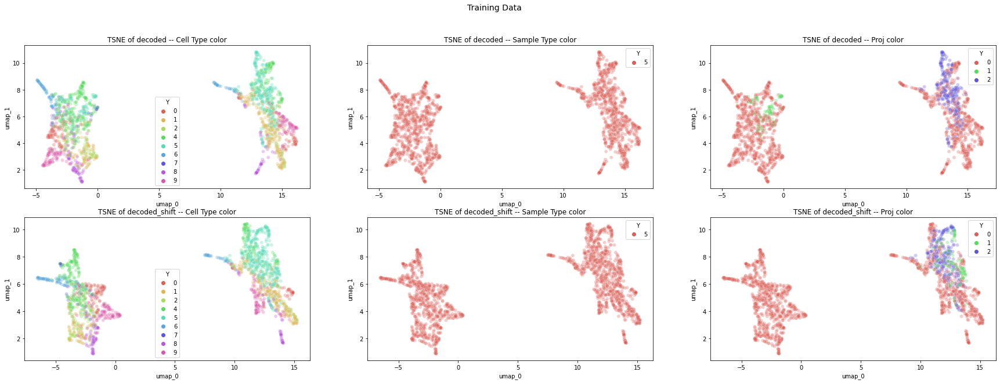

In [ ]:
# Plot patient of interest

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

proj_temp = np.array([0]*len(Y_temp)) # ["other"]*len(Y_temp)


idx_proj_cell0 = np.where(np.logical_and(perturb_temp == 0, np.logical_and(Y_temp == 5, label_temp == 5)))[0]
idx_reg_cell0 = np.where(np.logical_and(perturb_temp == 1, np.logical_and(Y_temp == 5, label_temp == 5)))[0]

proj_temp[idx_proj_cell0] = 1 #"cell0 projected to samp 1"
proj_temp[idx_reg_cell0] = 2 #"cell0 already in samp 1"


samp_0 = range(10000, 12000)

fig, axs = plt.subplots(2, 3, figsize=(30,10))


plot_df = vp.get_umap_for_plotting(np.asarray(decoded_0_0[samp_0,]))
vp.plot_umap(plot_df, color_vec=Y_temp[samp_0], ax=axs[0,0], title="TSNE of decoded -- Cell Type color")
vp.plot_umap(plot_df, color_vec=label_temp[samp_0], ax=axs[0,1], title="TSNE of decoded -- Sample Type color")
vp.plot_umap(plot_df, color_vec=proj_temp[samp_0], ax=axs[0,2], title="TSNE of decoded -- Proj color")

plot_df = vp.get_umap_for_plotting(np.asarray(decoded_0_1[samp_0,]))
vp.plot_umap(plot_df, color_vec=Y_temp[samp_0], ax=axs[1,0], title="TSNE of decoded_shift -- Cell Type color")
vp.plot_umap(plot_df, color_vec=label_temp[samp_0], ax=axs[1,1], title="TSNE of decoded_shift -- Sample Type color")
vp.plot_umap(plot_df, color_vec=proj_temp[samp_0], ax=axs[1,2], title="TSNE of decoded_shift -- Proj color")


fig.suptitle("Training Data", fontsize=14)

fig.show()



(2000, 2)
(2000, 2)
(2000, 2)
(2000, 2)


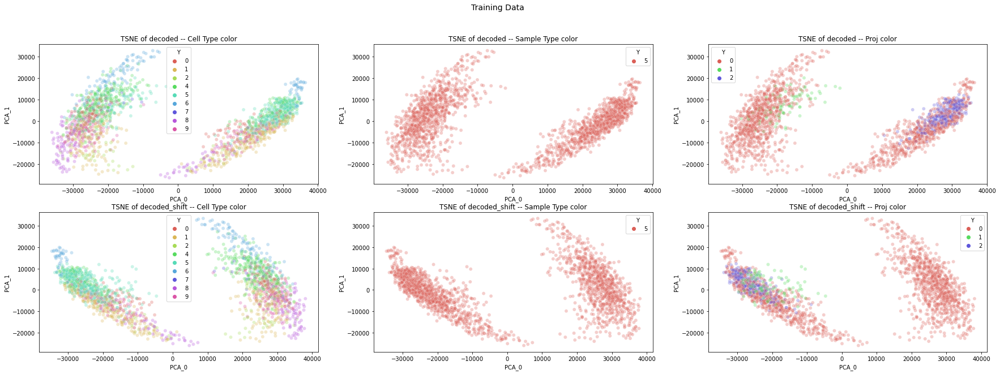

In [ ]:
# Plot patient of interest

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

proj_temp = np.array([0]*len(Y_temp)) # ["other"]*len(Y_temp)


idx_proj_cell0 = np.where(np.logical_and(perturb_temp == 0, np.logical_and(Y_temp == 5, label_temp == 5)))[0]
idx_reg_cell0 = np.where(np.logical_and(perturb_temp == 1, np.logical_and(Y_temp == 5, label_temp == 5)))[0]

proj_temp[idx_proj_cell0] = 1 #"cell0 projected to samp 1"
proj_temp[idx_reg_cell0] = 2 #"cell0 already in samp 1"


samp_0 = range(10000, 12000)

fig, axs = plt.subplots(2, 3, figsize=(30,10))


plot_df = vp.get_pca_for_plotting(np.asarray(decoded_0_0[samp_0,]))
vp.plot_pca(plot_df, color_vec=Y_temp[samp_0], ax=axs[0,0], title="TSNE of decoded -- Cell Type color", alpha=0.3)
vp.plot_pca(plot_df, color_vec=label_temp[samp_0], ax=axs[0,1], title="TSNE of decoded -- Sample Type color", alpha=0.3)
vp.plot_pca(plot_df, color_vec=proj_temp[samp_0], ax=axs[0,2], title="TSNE of decoded -- Proj color", alpha=0.3)

plot_df = vp.get_pca_for_plotting(np.asarray(decoded_0_1[samp_0,]))
vp.plot_pca(plot_df, color_vec=Y_temp[samp_0], ax=axs[1,0], title="TSNE of decoded_shift -- Cell Type color", alpha=0.3)
vp.plot_pca(plot_df, color_vec=label_temp[samp_0], ax=axs[1,1], title="TSNE of decoded_shift -- Sample Type color", alpha=0.3)
vp.plot_pca(plot_df, color_vec=proj_temp[samp_0], ax=axs[1,2], title="TSNE of decoded_shift -- Proj color", alpha=0.3)


fig.suptitle("Training Data", fontsize=14)

fig.show()



## Compare gene expression between sim and non

In [ ]:
# this is to generate noisy vector where the second elements is the largest
def add_vec_noise_idx(idx):
    in_vec =  np.array([0,0,0,0,0,0,0, 0, 0, 0])
    in_vec[idx] = 1000
    a = np.random.lognormal(mean=0, sigma=1, size=10) + in_vec
    return a/a.sum()


In [ ]:
np.unique(label_temp)

array([0, 1, 2, 3, 4, 5, 6, 7])

In [ ]:
# simulate cell type specific perturbation effects


label_temp = np.copy(Label_full)
perturb_temp = np.copy(Drug_full)

X_temp = np.copy(X_orig)
X_invs = np.copy(X_orig)
X_invs = scaler.inverse_transform(X_invs)

# make num_samp_gen samples per sample_id
num_samp_gen = 100

all_res = [0]*Y_train.shape[1]

deseq_matr = None

for cell_idx in range(Y_train.shape[1]):

    curr_deseq_matr_0 = None
    curr_deseq_matr_1 = None

    for samp_idx in np.unique(label_temp):

        # now use the encoder to get the latent spaces
        z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

        # simulate 1 cell type
        noisy_prop_vec = [add_vec_noise_idx(cell_idx) for i in range(num_samp_gen)]
        noisy_prop_vec = np.vstack(noisy_prop_vec)

        # randomly sample the sample_ids (integrating over all latent codes)
        z_rot_samp_idx = np.where(np.logical_and(perturb_temp == 0, label_temp == samp_idx))[0]

        if z_rot_samp_idx.shape[0] == 0:
            continue
        
        z_rot_samp_idx = np.random.choice(z_rot_samp_idx, num_samp_gen)
        z_rot_samp_idx = np.sort(z_rot_samp_idx)
        z_rot_samp = z_rot[z_rot_samp_idx,]

        # randomly sample the slack (integrating over all latent codes)
        z_slack_samp_idx = np.sort(np.random.choice(range(z_slack.shape[0]), num_samp_gen))
        z_slack_samp = z_slack[z_slack_samp_idx,]

        # sample the the perturbed latent space
        z_drug_0_idx = np.random.choice(np.where(perturb_temp == 0)[0], num_samp_gen)
        z_drug_0_idx = np.sort(z_drug_0_idx)
        z_drug_0 = z_drug[z_drug_0_idx,]

        z_drug_1_idx = np.random.choice(np.where(perturb_temp == 1)[0], num_samp_gen)
        z_drug_1_idx = np.sort(z_drug_1_idx)
        z_drug_1 = z_drug[z_drug_1_idx,]


        # put it all together

        # generate unperturbed data -- integrated over all other latent spaces
        z_concat_UNperturb = np.hstack([z_slack_samp, noisy_prop_vec, z_rot_samp, z_drug_0])
        decoded_0 = decoder.predict(z_concat_UNperturb, batch_size=batch_size)
        decoded_0 = scaler.inverse_transform(decoded_0)

        if curr_deseq_matr_0 is None:
            curr_deseq_matr_0 = decoded_0
        else:
            curr_deseq_matr_0 = np.vstack([curr_deseq_matr_0, decoded_0])



        # generate unperturbed data -- integrated over all other latent spaces
        z_concat_perturb = np.hstack([z_slack_samp, noisy_prop_vec, z_rot_samp, z_drug_1])
        decoded_1 = decoder.predict(z_concat_perturb, batch_size=batch_size)
        decoded_1 = scaler.inverse_transform(decoded_1)

        if curr_deseq_matr_1 is None:
            curr_deseq_matr_1 = decoded_1
        else:
            curr_deseq_matr_1 = np.vstack([curr_deseq_matr_1, decoded_1])

    # format the median diff 
    #decoded_0_med = np.median(curr_deseq_matr_0, axis=0)
    #decoded_1_med = np.median(curr_deseq_matr_1, axis=0)

    #res_df = pd.DataFrame(list(zip(decoded_0_med, decoded_1_med)), columns=["unpert", "pert"])
    decoded_med = np.median(curr_deseq_matr_1/curr_deseq_matr_0, axis=0)
    res_df = pd.DataFrame(decoded_med, columns=["FC"])

    res_df["log2FC"] = np.log2(res_df.FC)
    res_df["abslog2FC"] = np.absolute(res_df.log2FC)
    res_df["gene_ids"] = union_genes
    res_df.set_index("gene_ids", inplace = True)

    all_res[cell_idx] = res_df

    # format the deseq table
    curr_deseq_matr_0 = pd.DataFrame(curr_deseq_matr_0, columns=union_genes)
    curr_deseq_matr_0['CellType'] = Y_train.columns[cell_idx]
    curr_deseq_matr_0['SampleID'] = np.repeat([0,1,2,3,4,5,6,7], num_samp_gen)
    curr_deseq_matr_0['Perturbed'] = 0

    curr_deseq_matr_1 = pd.DataFrame(curr_deseq_matr_1, columns=union_genes)
    curr_deseq_matr_1['CellType'] = Y_train.columns[cell_idx]
    curr_deseq_matr_1['SampleID'] = np.repeat([0,1,2,3,4,5,6,7], num_samp_gen)
    curr_deseq_matr_1['Perturbed'] = 1

    curr_deseq_matr = pd.concat([curr_deseq_matr_0, curr_deseq_matr_1])

    if deseq_matr is None:
        deseq_matr = curr_deseq_matr
    else:
        deseq_matr = pd.concat([deseq_matr, curr_deseq_matr])


        


In [ ]:
deseq_matr

,A1BG,A2M,A2M-AS1,A4GALT,AAED1,AAGAB,AAK1,AAMP,AARSD1,AASDH,...,ZSWIM4,ZUFSP,ZWILCH,ZYX,ZZEF1,ZZZ3,hsa-mir-1199,CellType,SampleID,Perturbed
0,177.323425,37.873970,0.611801,38.811554,1375.978149,161.675156,68.097878,1347.185303,45.976521,7.163692,...,19.379507,13.722141,70.129700,264.113586,21.570679,31.043818,4.462992,B,0,0
1,276.812988,59.853439,2.918226,64.348061,1292.653687,178.179092,84.590355,1230.646240,67.620956,26.139954,...,36.042572,25.042343,90.658157,264.971039,46.888397,40.990360,10.716457,B,0,0
2,243.264771,46.716309,0.728461,42.730164,1602.937866,144.111221,55.699703,1262.857178,32.040916,12.913850,...,18.852139,9.457549,69.199158,227.365921,22.929274,11.623237,3.551341,B,0,0
3,312.072510,72.441849,3.733164,65.229660,1365.140991,261.926453,119.502411,1400.917603,74.647034,36.082973,...,36.863605,35.362526,86.107620,245.709656,56.015255,46.833458,10.598782,B,0,0
4,185.698807,83.113853,1.000638,54.671204,1631.949951,161.590454,58.448299,1608.231934,45.691177,12.437599,...,24.211042,10.675833,65.527145,363.157898,37.590347,18.993574,5.276155,B,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
795,13.709024,40.683727,0.058955,0.149583,1840.555908,856.053467,107.778061,945.314270,873.799622,75.657173,...,0.637399,2163.416748,95.663658,1028.588135,16.814322,493.256409,15.423571,T_Act,7,1
796,4.322605,46.710312,0.153410,0.413590,1743.598877,989.211487,68.513870,885.716492,672.021606,114.278572,...,2.279166,2286.594727,106.049652,1071.127441,25.457283,538.018555,16.062319,T_Act,7,1
797,9.928329,41.697464,0.421144,0.712427,1395.640137,854.965759,96.263954,776.760620,640.225586,130.807693,...,7.475496,2229.676025,127.149323,941.625671,46.217869,412.394592,26.155094,T_Act,7,1
798,12.836123,71.731819,0.218096,0.781983,1768.270630,950.129517,70.389114,992.684143,731.714539,224.344193,...,3.818023,2327.018555,106.883949,1573.930176,27.421122,495.511719,22.319757,T_Act,7,1


In [ ]:
deseq_res_file = os.path.join(res_data_path, f"{exp_id}_deseq_matr.csv")
deseq_matr.to_csv(deseq_res_file, index=False)


In [ ]:
""" 
class_color = [0]*len(decoded_0_med)

fig, axs = plt.subplots(10, 2, figsize=(15,60))
row_idx = 0
for cell_idx in range(Y_train.shape[1]):

    curr_cell_type = Y_train.columns[cell_idx]
    curr_res = all_res[cell_idx]

    unpert_val = curr_res["unpert"]
    pert_val = curr_res["pert"]

    max_val_log2 = np.max([np.log2(unpert_val), np.log2(unpert_val)])
    max_val = np.max([unpert_val, pert_val])
    plot_expr_corr(np.log2(unpert_val), np.log2(pert_val), axs[row_idx,0], title=f"{curr_cell_type} log2 Perturbed vs. unperturbed", xlab="non-perturbed", ylab="perturbed", class_id=class_color, max_val = max_val_log2)
    plot_expr_corr(unpert_val, pert_val, axs[row_idx,1], title=f"{curr_cell_type} Perturbed vs. unperturbed", xlab="non-perturbed", ylab="perturbed", class_id=class_color, max_val = max_val)

    row_idx = row_idx+1

fig.suptitle("Integrated over Perturb vs nonPerturb", fontsize=14)

fig.show()
 """

' \nclass_color = [0]*len(decoded_0_med)\n\nfig, axs = plt.subplots(10, 2, figsize=(15,60))\nrow_idx = 0\nfor cell_idx in range(Y_train.shape[1]):\n\n    curr_cell_type = Y_train.columns[cell_idx]\n    curr_res = all_res[cell_idx]\n\n    unpert_val = curr_res["unpert"]\n    pert_val = curr_res["pert"]\n\n    max_val_log2 = np.max([np.log2(unpert_val), np.log2(unpert_val)])\n    max_val = np.max([unpert_val, pert_val])\n    plot_expr_corr(np.log2(unpert_val), np.log2(pert_val), axs[row_idx,0], title=f"{curr_cell_type} log2 Perturbed vs. unperturbed", xlab="non-perturbed", ylab="perturbed", class_id=class_color, max_val = max_val_log2)\n    plot_expr_corr(unpert_val, pert_val, axs[row_idx,1], title=f"{curr_cell_type} Perturbed vs. unperturbed", xlab="non-perturbed", ylab="perturbed", class_id=class_color, max_val = max_val)\n\n    row_idx = row_idx+1\n\nfig.suptitle("Integrated over Perturb vs nonPerturb", fontsize=14)\n\nfig.show()\n '

In [ ]:
""" class_color = [0]*num_samp_gen+[1]*num_samp_gen
full_matr_sim = np.vstack((decoded_0, decoded_1))

fig, axs = plt.subplots(1, 2, figsize=(30,10))


plot_df_umap = vp.get_umap_for_plotting(np.asarray(full_matr_sim))
vp.plot_umap(plot_df_umap, color_vec=class_color, ax=axs[0], title="UMAP of decoded -- Sample Type color")


plot_df_pca = vp.get_pca_for_plotting(np.asarray(full_matr_sim))
vp.plot_pca(plot_df_pca, color_vec=class_color, ax=axs[1], title="PCA of decoded -- Sample Type color")


fig.suptitle("Training Data", fontsize=14)

fig.show()
 """

' class_color = [0]*num_samp_gen+[1]*num_samp_gen\nfull_matr_sim = np.vstack((decoded_0, decoded_1))\n\nfig, axs = plt.subplots(1, 2, figsize=(30,10))\n\n\nplot_df_umap = get_umap_for_plotting(np.asarray(full_matr_sim))\nplot_umap(plot_df_umap, color_vec=class_color, ax=axs[0], title="UMAP of decoded -- Sample Type color")\n\n\nplot_df_pca = get_pca_for_plotting(np.asarray(full_matr_sim))\nplot_pca(plot_df_pca, color_vec=class_color, ax=axs[1], title="PCA of decoded -- Sample Type color")\n\n\nfig.suptitle("Training Data", fontsize=14)\n\nfig.show()\n '

In [ ]:
top_genes = {}

for cell_idx in range(Y_train.shape[1]):

    a = all_res[cell_idx]
    a = a.iloc[np.where(np.logical_or(a.log2FC < -2, a.log2FC > 2))]
    top_genes[Y_train.columns[cell_idx]] = a.index.to_list()


In [ ]:
idx = 0
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

B


Index(['AC084018.1', 'ANXA3', 'APOBEC3A', 'CCDC146', 'CCL8', 'CKB', 'CLEC4C',
       'CMPK2', 'CXCL10', 'CXCL11', 'CXCL13', 'CXCL9', 'CYP19A1', 'DDX60',
       'ELOVL3', 'EXOC2', 'EXOC3L1', 'FUT4', 'GMPR', 'HAPLN3', 'HERC5',
       'HESX1', 'HRASLS2', 'IFI27', 'IFIT1', 'IL1RN', 'IL27', 'LAG3', 'LPIN2',
       'MED13', 'MNDA', 'NEXN', 'OAS1', 'OAS3', 'PARP9', 'PDGFRL', 'RSAD2',
       'RTP4', 'SAMD4A', 'SAMD9L', 'SCIN', 'SCT', 'SIGLEC1', 'SOBP', 'STAT2',
       'TARBP1', 'TGM1'],
      dtype='object', name='gene_ids')

In [ ]:
idx = 1
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

CD4_Mem_T


Index(['ANXA3', 'APOBEC3A', 'CCDC146', 'CCL8', 'CXCL10', 'CXCL11', 'CXCL13',
       'CXCL9', 'DDX60', 'ETV7', 'EXOC2', 'EXOC3L1', 'HESX1', 'HRASLS2',
       'IDO1', 'IFIT1', 'IFIT3', 'IL1RN', 'IL27', 'LAP3', 'PRF1', 'RSAD2',
       'RTP4', 'SAMD9L', 'SOBP', 'TREX1'],
      dtype='object', name='gene_ids')

In [ ]:
idx = 2
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

CD4_Naive_T


Index(['ANXA3', 'APOBEC3A', 'CCDC146', 'CCL7', 'CCL8', 'CCNA1', 'CMPK2',
       'CXCL10', 'CXCL11', 'CXCL13', 'CXCL9', 'DDX60', 'EPSTI1', 'ETV7',
       'EXOC2', 'EXOC3L1', 'HERC5', 'HESX1', 'HRASLS2', 'IDO1', 'IFI44L',
       'IFI6', 'IFIT1', 'IFIT2', 'IFIT3', 'IL1RN', 'IL27', 'NEXN', 'OAS1',
       'PRF1', 'RP11-288L9.1', 'RSAD2', 'RTP4', 'SAMD9L', 'SCIN', 'SIGLEC1',
       'SOBP', 'SZT2', 'TGM1'],
      dtype='object', name='gene_ids')

In [ ]:
idx = 3
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

CD8_T


Index(['ANXA3', 'APOBEC3A', 'CCDC146', 'CCL8', 'CXCL10', 'CXCL11', 'CXCL13',
       'CXCL9', 'EPSTI1', 'EXOC2', 'EXOC3L1', 'HESX1', 'IDO1', 'IFI44L',
       'IFIT1', 'IFIT3', 'IL1RN', 'RSAD2', 'SAMD9L', 'SOBP', 'TREX1'],
      dtype='object', name='gene_ids')

In [ ]:
idx = 4
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

CD14_Mono


Index(['AC009133.12', 'ADAM19', 'ANXA3', 'AP000640.2', 'B3GNT7', 'BCL2L14',
       'BRIP1', 'CCDC146', 'CCNA1', 'CD38', 'CDKL5', 'CH25H', 'CKB', 'CLEC4C',
       'CMPK2', 'CRYBG3', 'CXCL11', 'CXCL13', 'CXCL9', 'CYP19A1', 'DDX60',
       'DEFB1', 'DHX58', 'EIF2AK2', 'EIF4G3', 'ELOVL3', 'ENPP2', 'ETV7',
       'EXOC2', 'EXOC3L1', 'FAM76B', 'FUT4', 'GMPR', 'HAPLN3', 'HELZ2',
       'HERC5', 'HERC6', 'HES4', 'HESX1', 'HEXA-AS1', 'HRASLS2', 'IFI44L',
       'IFIT3', 'IL27', 'KIAA0040', 'LAG3', 'MAP1A', 'MAP2K6', 'MED13', 'MICB',
       'MSR1', 'MX1', 'NEXN', 'OAS3', 'PARP11', 'PDGFRL', 'PKD2L1', 'PNPT1',
       'RABGAP1L', 'RCBTB1', 'RP11-288L9.1', 'RP11-356I2.1', 'RTP4', 'SAMD4A',
       'SCIN', 'SCT', 'SIGLEC1', 'SLC38A5', 'SMPD3', 'SOBP', 'SRGAP2',
       'TARBP1', 'TGM1', 'TIMD4', 'TMEM110', 'TNFSF18', 'TNKS2-AS1', 'TRIM31',
       'ZBP1', 'ZWILCH'],
      dtype='object', name='gene_ids')

In [ ]:
idx = 5
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

CD16_Mono


Index(['AC009133.12', 'ADAM19', 'ANXA3', 'BCL2L14', 'BRIP1', 'CCDC146',
       'CCNA1', 'CH25H', 'CLEC4C', 'CXCL13', 'CXCL9', 'CYP19A1', 'ELOVL3',
       'ENPP2', 'EXOC3L1', 'FAM76B', 'FUT4', 'HAPLN3', 'HESX1', 'HRASLS2',
       'IL27', 'LAG3', 'NEXN', 'PDGFRL', 'PKD2L1', 'RP11-356I2.1', 'SCIN',
       'SCT', 'SIGLEC1', 'SLC38A5', 'SMPD3', 'SOBP', 'SRGAP2', 'TARBP1',
       'TGM1', 'TMEM110', 'TNFSF18', 'TRIM31'],
      dtype='object', name='gene_ids')

In [ ]:
idx = 6
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

DC


Index(['AC009133.12', 'ACKR4', 'ADPGK-AS1', 'ALG1', 'ANXA3', 'AP000640.2',
       'ATL1', 'ATP7A', 'B3GNT7', 'BCL2L14',
       ...
       'TNFSF18', 'TNKS2-AS1', 'TRIM31', 'TSLP', 'UBD', 'UTP15', 'VSIG10L',
       'ZBP1', 'ZNF285', 'ZWILCH'],
      dtype='object', name='gene_ids', length=121)

In [ ]:
idx = 7
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

Mk


Index(['AC009133.12', 'ADAM19', 'ANXA3', 'BCL2L14', 'BHLHE40-AS1', 'BRIP1',
       'CCDC146', 'CCL7', 'CCL8', 'CCNA1', 'CDKL5', 'CH25H', 'CLEC4C', 'CMPK2',
       'CXCL11', 'CXCL13', 'CXCL9', 'CYP19A1', 'DDX60', 'DEFB1', 'ELOVL3',
       'ENPP2', 'ETV7', 'EXOC2', 'EXOC3L1', 'HAPLN3', 'HESX1', 'HRASLS2',
       'IFIT1', 'IFIT3', 'IL27', 'LAG3', 'NEXN', 'PDGFRL', 'PNPT1', 'PRF1',
       'RP11-288L9.1', 'RP11-356I2.1', 'RSAD2', 'RTP4', 'SAMD4A', 'SCIN',
       'SIGLEC1', 'SOBP', 'SRGAP2', 'SZT2', 'TGM1', 'TIMD4', 'TMEM110',
       'TNFSF18', 'TNKS2-AS1', 'TREX1', 'TRIM31'],
      dtype='object', name='gene_ids')

In [ ]:
idx = 8
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

NK


Index(['ANXA3', 'CCDC146', 'CCL8', 'CLEC4C', 'CXCL10', 'CXCL11', 'CXCL13',
       'CXCL9', 'CYP19A1', 'EXOC2', 'EXOC3L1', 'HESX1', 'HRASLS2', 'IDO1',
       'IFIT3', 'IL1RN', 'LAG3', 'RSAD2', 'SOBP', 'TGM1', 'TREX1'],
      dtype='object', name='gene_ids')

In [ ]:
idx = 9
print(true_prop_df.columns[idx])
a = all_res[idx]

a.iloc[np.where(a.log2FC > 3)].index

T_Act


Index(['AC009133.12', 'ANXA3', 'APOBEC3A', 'BCL2L14', 'CCL8', 'CCNA1',
       'CLEC4C', 'CXCL11', 'CXCL13', 'CXCL9', 'CYP19A1', 'EXOC3L1', 'HELZ2',
       'HESX1', 'HRASLS2', 'IL1RN', 'IL27', 'LAG3', 'SCIN', 'SOBP', 'TGM1',
       'TREX1'],
      dtype='object', name='gene_ids')

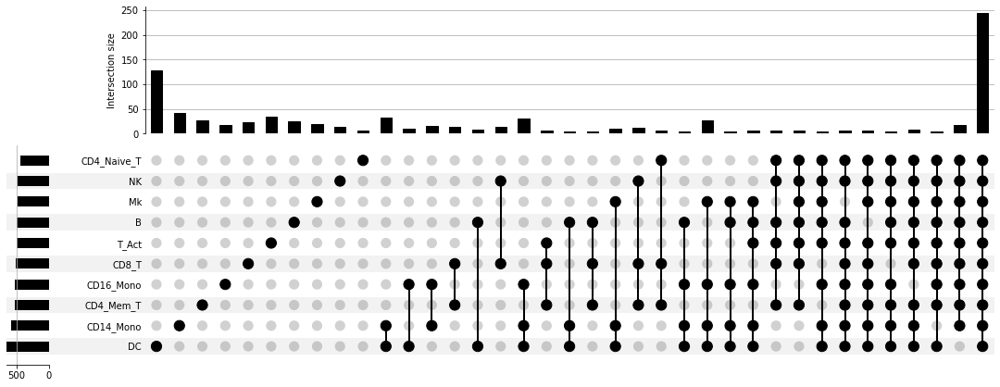

In [ ]:
cell_diff = from_contents(top_genes)
ax_dict = UpSet(cell_diff, subset_size='count', orientation='horizontal', min_subset_size=5).plot()


In [ ]:

kang_diff_exp_genes = ["CXCL10", "IFIT1", "RSAD2", "IFIT3", "CCL8", "IFI6", "ISG15", "CMPK2", "CXCL11", "IFIT2", "APOBEC3A", "OAS1", "HERC5", "MX1", "OAS3", "ETV7", "IFITM3", "TNFSF13B", "CCL7", "IFI44", "PLSCR1", "IDO1", "LAG3", "GBP1", "NEXN", "MX2", "ISG20", "EPSTI1", "MT2A", "LGALS9", "IL1RN", "IFI44L", "NT5C3A", "TNFSF10", "STAT2", "APOBEC3B", "LAMP3", "IFNG", "AIM2", "SAMD9L", "DDX58"]
all_res[8].loc[kang_diff_exp_genes]

,FC,log2FC,abslog2FC
gene_ids,,,
CXCL10,14.169910,3.824759,3.824759
IFIT1,7.467165,2.900561,2.900561
RSAD2,16.280788,4.025099,4.025099
IFIT3,8.833914,3.143053,3.143053
CCL8,29.830843,4.898733,4.898733
IFI6,3.835999,1.939602,1.939602
ISG15,1.009632,0.013830,0.013830
CMPK2,7.725155,2.949564,2.949564
CXCL11,48.305805,5.594125,5.594125


In [ ]:
a = all_res[8]
a = a.sort_values(by=['log2FC'], ascending=False)
a.iloc[0:41]

,FC,log2FC,abslog2FC
gene_ids,,,
ANXA3,54.029648,5.755680,5.755680
CXCL11,48.305805,5.594125,5.594125
CCL8,29.830843,4.898733,4.898733
TREX1,22.022882,4.460931,4.460931
RSAD2,16.280788,4.025099,4.025099
CXCL13,15.108780,3.917315,3.917315
CXCL10,14.169910,3.824759,3.824759
IL1RN,13.142637,3.716183,3.716183
LAG3,11.354052,3.505135,3.505135


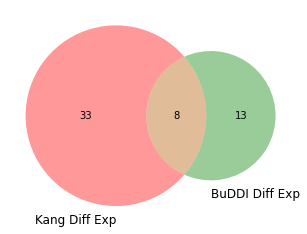

In [ ]:
a = all_res[8]
a = a.sort_values(by=['log2FC'], ascending=False)
a.iloc[0:41]


venn2([set(kang_diff_exp_genes), set(a.iloc[np.where(a.log2FC > 3)].index)], set_labels = ('Kang Diff Exp', 'BuDDI Diff Exp'))
plt.show()

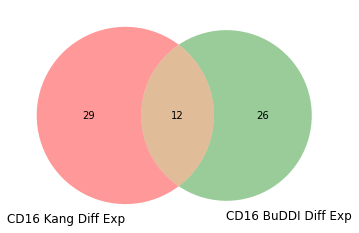

In [ ]:
kang_CD16_diff_exp_genes = ["CXCL11", "CCL8", "IL27", "IFIT1", "DEFB1", "HESX1", "ISG15", "RSAD2", "CH25H", "TGM1", "NUPR1", "IDO1", "CD38", "GMPR", "IFIT2", "BCL2L14", "CXCL10", "IFIT3", "CCNA1", "HES4", "PRR5", "CMPK2", "HRASLS2", "MX1", "HERC5", "NT5C3A", "OASL", "ISG20", "SCIN", "APOBEC3A", "MX2", "SAMD4A", "SIGLEC1", "LAG3", "NEXN", "ZBP1", "PNPT1", "SLC38A5", "DHX58", "DDX58", "CACNA1A"]
a = all_res[5]
a = a.sort_values(by=['log2FC'], ascending=False)

venn2([set(kang_CD16_diff_exp_genes), set(a.iloc[np.where(a.log2FC > 3)].index)], set_labels = ('CD16 Kang Diff Exp', 'CD16 BuDDI Diff Exp'))
plt.show()

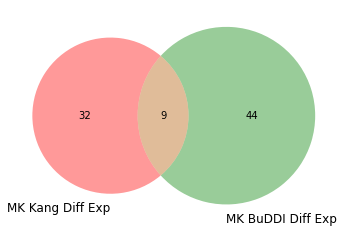

In [ ]:
kang_MK_diff_exp_genes = ["RSAD2", "CXCL10", "CCL8", "IFIT3", "MX1", "IDO1", "TREX1", "IFI6", "ISG15", "IFIT1", "CXCL11", "OAS3", "EPSTI1", "TNFSF10", "MT2A", "DDX58", "MX2", "CMPK2", "SPATS2L", "LY6E", "IFI44L", "IL1RN", "SAMD9L", "TRIM22", "TARBP1", "HAPLN3", "EIF2AK2", "IFITM3", "ISG20", "HERC5", "IFI44", "OAS1", "PARP14", "OASL", "APOBEC3A", "IFIH1", "PNPT1", "HELZ2", "PLSCR1", "IFIT2", "HERC6"]

a = all_res[7]
a = a.sort_values(by=['log2FC'], ascending=False)

venn2([set(kang_MK_diff_exp_genes), set(a.iloc[np.where(a.log2FC > 3)].index)], set_labels = ('MK Kang Diff Exp', 'MK BuDDI Diff Exp'))
plt.show()



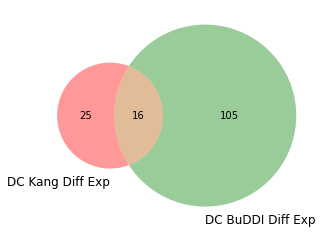

In [ ]:
kang_DC_diff_exp_genes = ["IFIT1", "IFIT3", "IFIT2", "TNFSF10", "CXCL10", "CXCL11", "RSAD2", "CMPK2", "CCL8", "ISG15", "APOBEC3A", "ANKRD22", "OASL", "HERC6", "IL1RN", "DDX58", "IFI27", "OAS2", "HERC5", "LAG3", "IFITM3", "OAS1", "HES4", "CD38", "DHX58", "OAS3", "MX1", "IFI6", "TGM1", "ETV7", "IFI44L", "PDGFRL", "SLC38A5", "HESX1", "NT5C3A", "CXCL13", "LY6E", "APOBEC3B", "CXCL9", "GBP5", "NEXN"]


a = all_res[6]
a = a.sort_values(by=['log2FC'], ascending=False)

venn2([set(kang_DC_diff_exp_genes), set(a.iloc[np.where(a.log2FC > 3)].index)], set_labels = ('DC Kang Diff Exp', 'DC BuDDI Diff Exp'))
plt.show()



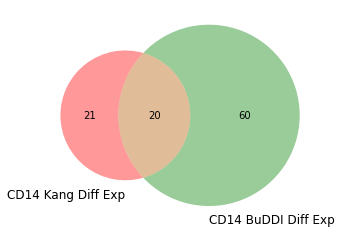

In [ ]:
kang_CD14_diff_exp_genes = ["CCL8", "CXCL11", "HESX1", "CXCL10", "CCNA1", "NUPR1", "TGM1", "IFIT1", "IFIT2", "IFIT3", "RSAD2", "HRASLS2", "CD38", "BCL2L14", "ISG15", "IL27", "NEXN", "PDGFRL", "CMPK2", "DEFB1", "HES4", "EDN1", "IL1RN", "IRG1", "BATF2", "SCIN", "NCOA7", "HERC5", "IDO1", "MDK", "PRLR", "RABGAP1L", "APOBEC3A", "LAG3", "IFITM1", "MX1", "ZBP1", "CXCL9", "USP18", "NT5C3A"]



a = all_res[4]
a = a.sort_values(by=['log2FC'], ascending=False)

venn2([set(kang_DC_diff_exp_genes), set(a.iloc[np.where(a.log2FC > 3)].index)], set_labels = ('CD14 Kang Diff Exp', 'CD14 BuDDI Diff Exp'))
plt.show()

